# Molecular Therapy Figures
## Xiaonan Wang
## 22Apr2020

This notebook is to generate the figures used in the paper in Molecular Therapy. We have PBMC samples from 3 donors and *in vitro* T cell samples from 3 donors with or without stimulation. In total, there are 9 samples:
    - PBMC (17119 cells in total): 
        - Donor1 (5553 cells)
        - Donor2 (6015 cells)
        - Donor3 (5551 cells)
    - Tcells (40557 cells in total): 
        - Donor1/Unstimulated (5854 cells)
        - Donor2/Unstimulated (6148 cells)
        - Donor3/Unstimulated (6879 cells)
        - Donor1/Stimulated (7222 cells)
        - Donor2/Stimulated (7363 cells)
        - Donor3/Stimulated (7091 cells)
        
The h5ad files used as initial inputs were generated from separate jupyter notebooks, including:
    1. TenX_preanalysis.ipynb: Preanalysis
    2. PBMC_BatchCorrection_R.R: MNN batch correction of PBMC samples in R
    3. PBMC_BC_analysis.ipynb: Analysis of PBMC samples after batch correction
    4. Tcells_in_PBMC.ipynb: Analysis of T cells in PBMC samples after batch correction
    5. Project_PBMC_onto_PBMC68Kzheng17.ipynb: Projection of PBMC samples onto Zheng's 68K PBMC dataset [Zheng2017](https://www.nature.com/articles/ncomms14049)
    6. Tcells_analysis.ipynb: Analysis of *in vitro* T cells samples
    7. Tcells_conST_sep.ipynb: Analysis of *in vitro* T cells split by condition (+Antigen/-Antigen)
    8. Tcells_vecPB_sep.ipynb: Analysis of *in vitro* T cells split by vector expression (vector positive/vector negative)
    9. Project_Tcells_onto_Bulk_EMTAB2319.ipynb: Project Tcells onto EMTAB2319 dataset [Bonnal2015](https://www.nature.com/articles/sdata201551)
    10. Exhaustion_Sig_calculation.ipynb: Calculation of exhaustion sigature score

In [1]:
#%matplotlib nbagg
%load_ext rpy2.ipython
import numpy as np
import matplotlib.pyplot as plt
import scanpy as sc
import pandas as pd
import seaborn as sns
from pandas.api.types import is_categorical_dtype
import networkx as nx

sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)

from matplotlib.colors import LinearSegmentedColormap
cmap = LinearSegmentedColormap.from_list(name='gene_cmap', colors=['lightgrey', 'thistle', 'red', 'darkred']) 

sc.settings.set_figure_params(dpi=80, color_map='viridis', vector_friendly=False,  dpi_save=300)
sc.logging.print_versions()

/home/xw251/miniconda3/envs/scanpy_py368/lib/python3.6/site-packages/anndata/_core/anndata.py:21: FutureWarning: pandas.core.index is deprecated and will be removed in a future version.  The public classes are available in the top-level namespace.
  from pandas.core.index import RangeIndex


scanpy==1.5.0 anndata==0.7.1 numpy==1.18.2 scipy==1.4.1 pandas==1.0.3 scikit-learn==0.22.2.post1 statsmodels==0.11.1 python-igraph==0.8.0 louvain==0.6.1 leidenalg==0.7.0


# SubFunctions

In [2]:
#################################################################################################
def lv_stat_barplot(data, splitby='key_labels', colorby='louvain_groups', hatch=True, ylab="% in each group", 
                    xlab="Clusters", figsize=(10, 3), startangle = 90, ncols=3, stacked=True, plotMethod='Barplot', 
                    orientation  = 'vertical', fontsize=11, color=None, save=None):
    """\
    User defined barplot function
    
    Parameters
    ----------
    adata
        Annotated data matrix
    splitby
        The key of the observations for spliting the bars. Default: key_labels
    colorby    
        The key of the obvervations for coloring the bars. Default: louvain_groups
    hatch
        True/False. whether to use hatch. Default: True
    ylab
        Label for y axis. Default: % in each group
    xlab
        Label for x axis. Default: Clusters
    figsize
        Figure of the figure. Default: (10,3)
    startangle
        Startangle for pie chart. Default: 90
    ncols
        Number of plots per row, onlly for pie chart. Default: 3
    stacked
        True/False. Whether to stack the bars. Default: True
    plotMethod
        Type of plot, options: Barplot, Stackedarea, Panel_Column_Chart and PieChart. Default: Barplot
    orientation
        Orientation of barplot. Default: vertical
    fontsize
        fontsize of labels in pie chart. Default: 11
    color
        User defined color for barplot. Default: None
    save
        File name for saving the plot
    
    Returns
    -------
    **User defined type of plot, either barplot or piechart**
    
    Examples
    --------
    >>> lv_stat_barplot(adata, xlab="Louvain Clusters", splitby="Louvain_Clusters", colorby="Donor", color='white', save='xxx.pdf')
    
    """
    
    if splitby in data.obs_keys():
        g1D = data.obs[splitby]
    elif splitby in data.var_names:
        g1D = data[:, splitby].X
        g1D = ['Positive' if x > 0 else 'Negative' for x in g1D]
        g1D = pd.Series(g1D, dtype = 'category')
        g1D = g1D.cat.reorder_categories(['Negative', 'Positive'])
        g1D = g1D.values
    else:
        raise ValueError('"' + splitby + '" is invalid!'
                                 + ' specify valid sample annotation, one of '
                                 + str(data.obs_keys()) + ' or a gene name '
                                 + str(data.var_names))
    
    if colorby in data.obs_keys():
        g2D = data.obs[colorby]
    elif colorby in data.var_names:
        g2D = data[:, colorby].X
        g2D = ['Positive' if x > 0 else 'Negative' for x in g2D]
        g2D = pd.Series(g2D, dtype = 'category')
        g2D = g2D.cat.reorder_categories(['Negative', 'Positive'])
        g2D = g2D.values
    else:
        raise ValueError('"' + colorby + '" is invalid!'
                                 + ' specify valid sample annotation, one of '
                                 + str(data.obs_keys()) + ' or a gene name '
                                 + str(data.var_names))
    
    df = pd.crosstab(g1D, g2D)
    df_new = df.div(df.sum(axis=1),axis=0)
    
    #print(df_new)
    if plotMethod=='Barplot':
        if color is None:
            color = [[vega_20_scanpy[x]]*df_new.shape[0] for x in range(df_new.shape[1])]
            color = np.stack(color)
            #print(color)
        if orientation == 'horizontal':
            df_new = -df_new
            ax = df_new.plot.barh(stacked=stacked, color=color, edgecolor="black")
            plt.xticks(np.arange(0, 101, 20)/-100)
            ax.set_ylabel(xlab)
            ax.set_xlabel(ylab)
            ax.set_xticklabels(np.arange(100, -1, -20),rotation=0)
            ax.grid()
        else:
            df_new = -df_new
            ax = df_new.plot.bar(stacked=stacked, color=color, edgecolor="black")
            plt.yticks(np.arange(0, 101, 20)/-100, np.arange(100, -1, -20))
            ax.set_xlabel(xlab)
            ax.set_ylabel(ylab)
            ax.set_xticklabels(df_new.index,rotation=0)
            if len(data.obs[splitby].cat.categories) >= 5:
                plt.xticks(rotation=90)
            ax.grid()
        if hatch is True:
            hatch1 = [[hatches[x]]*df_new.shape[0] for x in range(df_new.shape[1])]
            hatch1 = np.hstack(hatch1)
            for i, thisbar in enumerate(ax.patches):
                thisbar.set_hatch(hatch1[i])
        ax.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
    elif plotMethod=='Stackedarea':
        hatch1 = hatches[0:df_new.shape[1]]
        if color is None:
            color = color_20[0:df_new.shape[1]]
        ax = df_new.plot.area(color=color)
        ax.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
        ax.set_xlabel(xlab)
        ax.set_ylabel(ylab)
        ax.grid()
    elif plotMethod=='Panel_Column_Chart':
        sns.set_style("whitegrid")
        ax = df_new.plot.bar(subplots=True, sharey=True, 
              figsize=(6, 5), legend=False,  
              grid=False, edgecolor='none', 
              fontsize=12)    
        plt.text(-1, 2, ylab, fontsize=12, rotation=0) #df_new.shape[1]/2
        sns.despine(left=True)
        for ax1 in ax:  # set the names beside the axes
            #ax1.lines[0].set_visible(False)  # remove ugly dashed line
            ax1.set_title('')
            sername = ax1.get_legend_handles_labels()[1][0]
            ax1.text(7, 0.5, sername, fontsize=12)
        #plt.suptitle("My panel chart", fontsize=18)
    elif plotMethod=='PieChart':
        import math
        nrow = math.ceil(len(df.index)/ncols)
        fig, axes = plt.subplots(nrow,ncols, figsize=figsize)
        for i in range(len(df.index)):
            if nrow==1:
                ax = axes[i % ncols]
            else:
                ax = axes[i // ncols, i % ncols]
            patches, texts = ax.pie(df.iloc[i,:] ,startangle = startangle, counterclock=False, colors=color) 
            #[ _.set_fontsize(3) for _ in texts]
            ax.set_title(df.index[i], fontsize=fontsize) #,  loc='left'
        leg = plt.figlegend(patches, df.columns,  loc='right', fontsize=fontsize)
        fig.subplots_adjust(top=0.8,right=0.8)     
    
    
    if save is not None:
        plt.savefig('./figures/Barplot_'+save, bbox_inches='tight')
    return df

In [3]:
############################################################################################################################
import math
def TenX_violinplot(data, keys, title=None, ncols=4, colorby='louvain_groups', colors=None, log=False, cut=0, 
                    scale='width', order=None, ylab='log norm counts', save=None):
    """\
    User defined violin plot function
    
    Parameters
    ----------
    adata
        Annotated data matrix
    keys
        The key of the observations for spliting the bars.
    title
        Title of the plots. Default: None
    ncols
        Number of plots for each row. Default: 4
    colorby    
        The key of the obvervations for coloring the bars. Default: louvain_groups
    colors
        Palette of the plot. Default: None
    log
        True/False. If True, the adata.X will be logged (log2). Default: False
    cut
        cut in violin plot function. Default: 0
    scale
        scale in violin plot function. Default: width
    order
        order in violin plot function. Default: None
    ylab
        Label for y axis. Default: log norm counts
    save
        File name for saving the plot
    
    Returns
    -------
    **User defined type of plot, either barplot or piechart**
    
    Examples
    --------
    >>> TenX_violinplot(adata, keys=genes, ncols=3,colorby='Ex_Score', colors=['#d62728', '#d3d3d3'], save='xxx.pdf')
    
    """
        
    nrow = math.ceil(len(keys)/ncols)
    if len(keys) < ncols:
        ncols = len(keys)
    fig, axs = plt.subplots(nrow,ncols, figsize=(ncols*3.5, nrow*3))
    if len(keys) > 1:
        axs = axs.ravel()
    else:
        axs = [axs]
    fig.subplots_adjust(hspace = .5, wspace=.5)
    for idx, ax in enumerate(axs):
        kID = keys[idx]
        if kID in data.obs_keys():
            norD = data.obs[kID]
        elif kID in data.raw.var_names:
            norD = data.raw[:,kID].X.flatten()
        else:
            raise ValueError('"' + keys + '" is invalid!'
                                 + ' specify valid sample annotation, one of '
                                 + str(data.obs_keys()) + ' or a gene name '
                                 + str(data.raw.var_names))
        if log==True:
            norD = np.log2(norD+1)
        group = data.obs[colorby].values
            
        sns.violinplot(x=group, y=norD, ax=ax, palette=colors, cut=cut, scale=scale, order=order)
            
        if title is None:
            ax.set_title(kID)
        else:
            ax.set_title(title)
        ax.set_xlabel("")
        ax.set_ylabel(ylab)
        ax.grid(False)
    plt.tight_layout()
    if save is not None:
        plt.savefig('Violinplot_'+save)

In [4]:
color_20 = ['#4428cb', '#ea5721', '#549b7c', '#337ab7', '#e1bab4', '#4b6846', '#bb61c3', '#214e75', '#a8fffd', '#420420', '#efe8ef', '#177abe', '#093646', '#fe22f6', '#43442d', '#d4da3f', '#c88dd1', '#0c3b72']
hatches = [ "..." , "---", "///" , "|" , "-" , "+" , "x", "o", "O", ".", "*", "/" , "\\" , "|" , "-" , "+" , "x", "o", "O", ".", "*"]
vega_20_scanpy = [
    '#1f77b4', '#ff7f0e', '#2ca02c', '#d62728',
    '#9467bd', '#8c564b', '#e377c2',  # '#7f7f7f' removed grey
    '#bcbd22', '#17becf',
    '#aec7e8', '#ffbb78', '#98df8a', '#ff9896',
    '#c5b0d5', '#c49c94', '#f7b6d2',  # '#c7c7c7' removed grey
    '#dbdb8d', '#9edae5',
    '#ad494a', '#8c6d31']  # manual additions

In [5]:
sns.reset_orig()

# Read in Data Files

In [5]:
PBMC_data = sc.read('../write_new/PBMC_data_BC_HVG.h5ad', cache=True)
DT_data = sc.read('../write_new/DT_data_OL_corrected.h5ad', cache=True)
DS_data = sc.read('../write_new/DS_data_OL_corrected.h5ad', cache=True)
Tcells_data = sc.read('../write_new/Tcells_corrected.h5ad', cache=True)
VN_data = sc.read('../write_new/VN_corrected.h5ad', cache=True)
VP_data = sc.read('../write_new/VP_corrected.h5ad', cache=True)
Tcells_PBMC_data = sc.read('../write_new/Tcells_PBMC_data.h5ad', cache=True)

In [16]:
print("PBMC: "+str(PBMC_data.X.shape))
print("DT:"+str(DT_data.X.shape))
print("DS: "+str(DS_data.X.shape))
print("Tcells "+str(Tcells_data.X.shape))
print("VN: "+str(VN_data.X.shape))
print("VP: "+str(VP_data.X.shape))
print("PBMC_Tcells: "+str(Tcells_PBMC_data.X.shape))

PBMC: (17119, 1607)
DT:(18881, 1332)
DS: (21676, 1332)
Tcells (40557, 999)
VN: (31042, 999)
VP: (9515, 999)
PBMC_Tcells: (12868, 1607)


In [7]:
VP_data.obs['phase'] = Tcells_data[VP_data.obs_names,:].obs['phase']
VN_data.obs['phase'] = Tcells_data[VN_data.obs_names,:].obs['phase']
DT_data.obs['phase'] = Tcells_data[DT_data.obs_names,:].obs['phase']
DS_data.obs['phase'] = Tcells_data[DS_data.obs_names,:].obs['phase']

In [8]:
Tcells_data.obs['phase_comb'] = [x if x == 'G1' else 'G2M/S' for x in Tcells_data.obs['phase']]
VP_data.obs['phase_comb'] = [x if x == 'G1' else 'G2M/S' for x in VP_data.obs['phase']]
VN_data.obs['phase_comb'] = [x if x == 'G1' else 'G2M/S' for x in VN_data.obs['phase']]
DT_data.obs['phase_comb'] = [x if x == 'G1' else 'G2M/S' for x in DT_data.obs['phase']]
DS_data.obs['phase_comb'] = [x if x == 'G1' else 'G2M/S' for x in DS_data.obs['phase']]

In [6]:
PBMC_data.obs['CD8_binary'] = ((PBMC_data.raw[:,'CD8A'].X>0) | (PBMC_data.raw[:,'CD8B'].X>0))
PBMC_data.obs['CD8_binary'] = PBMC_data.obs['CD8_binary'].astype('category')
PBMC_data.obs['CD8_binary'] = PBMC_data.obs['CD8_binary'].cat.rename_categories(['CD8-', 'CD8+'])
PBMC_data.obs['Project_onto_bulk_new'] = PBMC_data.obs['CD8_binary'].astype(str)+'_'+ PBMC_data.obs['Proj_onto_bulk'].astype(str)

Tcells_data.obs['CD8_binary'] = ((Tcells_data.raw[:,'CD8A'].X>0) | (Tcells_data.raw[:,'CD8B'].X>0))
Tcells_data.obs['CD8_binary'] = Tcells_data.obs['CD8_binary'].astype('category')
Tcells_data.obs['CD8_binary'] = Tcells_data.obs['CD8_binary'].cat.rename_categories(['CD8-', 'CD8+'])
Tcells_data.obs['Project_onto_bulk_new'] = Tcells_data.obs['CD8_binary'].astype(str)+'_'+ Tcells_data.obs['Proj_onto_bulk'].astype(str)

Tcells_PBMC_data.obs['CD8_binary'] = ((Tcells_PBMC_data.raw[:,'CD8A'].X>0) | (Tcells_PBMC_data.raw[:,'CD8B'].X>0))
Tcells_PBMC_data.obs['CD8_binary'] = Tcells_PBMC_data.obs['CD8_binary'].astype('category')
Tcells_PBMC_data.obs['CD8_binary'] = Tcells_PBMC_data.obs['CD8_binary'].cat.rename_categories(['CD8-', 'CD8+'])
Tcells_PBMC_data.obs['Project_onto_bulk_new'] = Tcells_PBMC_data.obs['CD8_binary'].astype(str)+'_'+ Tcells_PBMC_data.obs['Proj_onto_bulk'].astype(str)

DT_data.obs['CD8_binary'] = ((DT_data.raw[:,'CD8A'].X>0) | (DT_data.raw[:,'CD8B'].X>0))
DT_data.obs['CD8_binary'] = DT_data.obs['CD8_binary'].astype('category')
DT_data.obs['CD8_binary'] = DT_data.obs['CD8_binary'].cat.rename_categories(['CD8-', 'CD8+'])
DT_data.obs['Project_onto_bulk_new'] = DT_data.obs['CD8_binary'].astype(str)+'_'+ DT_data.obs['Proj_onto_bulk'].astype(str)

DS_data.obs['CD8_binary'] = ((DS_data.raw[:,'CD8A'].X>0) | (DS_data.raw[:,'CD8B'].X>0))
DS_data.obs['CD8_binary'] = DS_data.obs['CD8_binary'].astype('category')
DS_data.obs['CD8_binary'] = DS_data.obs['CD8_binary'].cat.rename_categories(['CD8-', 'CD8+'])
DS_data.obs['Project_onto_bulk_new'] = DS_data.obs['CD8_binary'].astype(str)+'_'+ DS_data.obs['Proj_onto_bulk'].astype(str)

# Main Figure 2

## Figure 2A

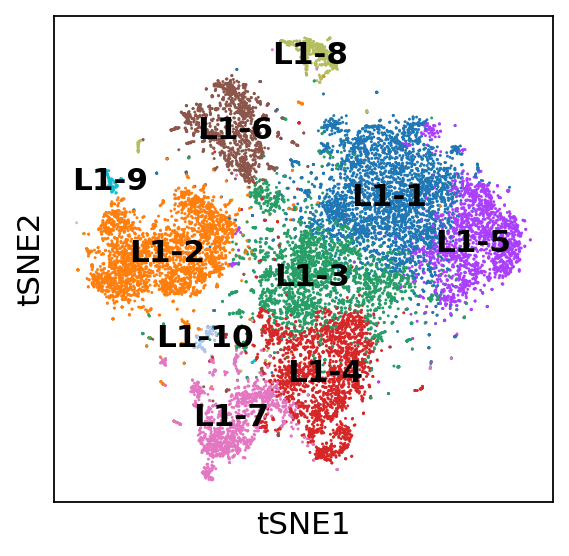

In [19]:
sc.pl.tsne(PBMC_data, color='Louvain_Clusters', legend_fontsize=14, legend_loc='on data', title="")

## Figure 2B

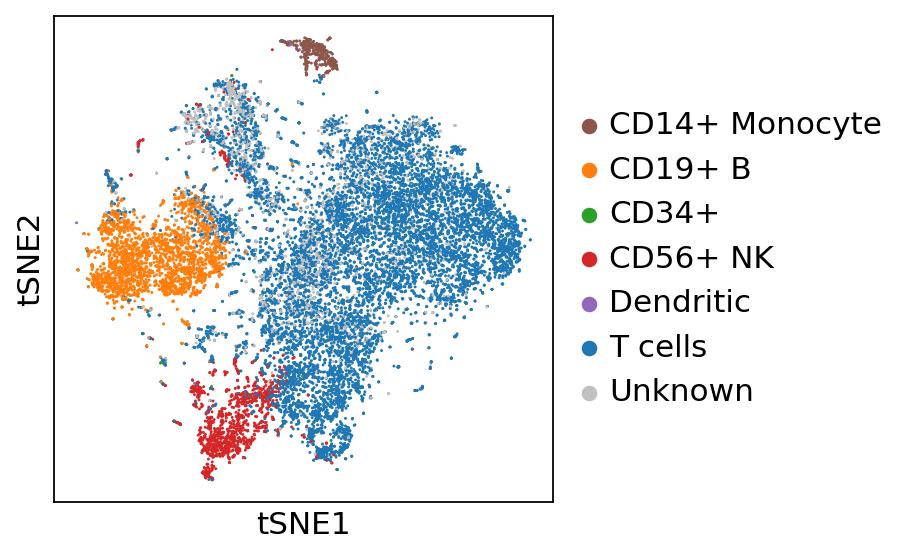

In [96]:
sc.pl.tsne(PBMC_data, color=['Proj_onto_68K'], legend_loc='right margin', legend_fontsize=14,title="")

## Figure 2C

Proj_onto_bulk,CD14+ Monocyte,CD19+ B,CD34+,CD56+ NK,Central Memory,Dendritic,Effector Memory,Naive,Treg,unknown
Louvain_Clusters,,,,,,,,,,
L1-1,0,3,0,0,336,0,5,2673,15,566
L1-2,1,2467,2,3,68,1,17,236,69,113
L1-3,2,7,2,6,499,1,267,1253,240,629
L1-4,0,0,1,94,16,0,1794,194,67,180
L1-5,0,0,0,0,31,0,1,1753,1,81
L1-6,0,3,5,86,24,0,166,178,377,552
L1-7,1,0,8,1110,1,3,213,8,6,10
L1-8,367,3,0,24,2,10,9,20,3,14
L1-9,0,21,0,7,0,10,7,50,13,6


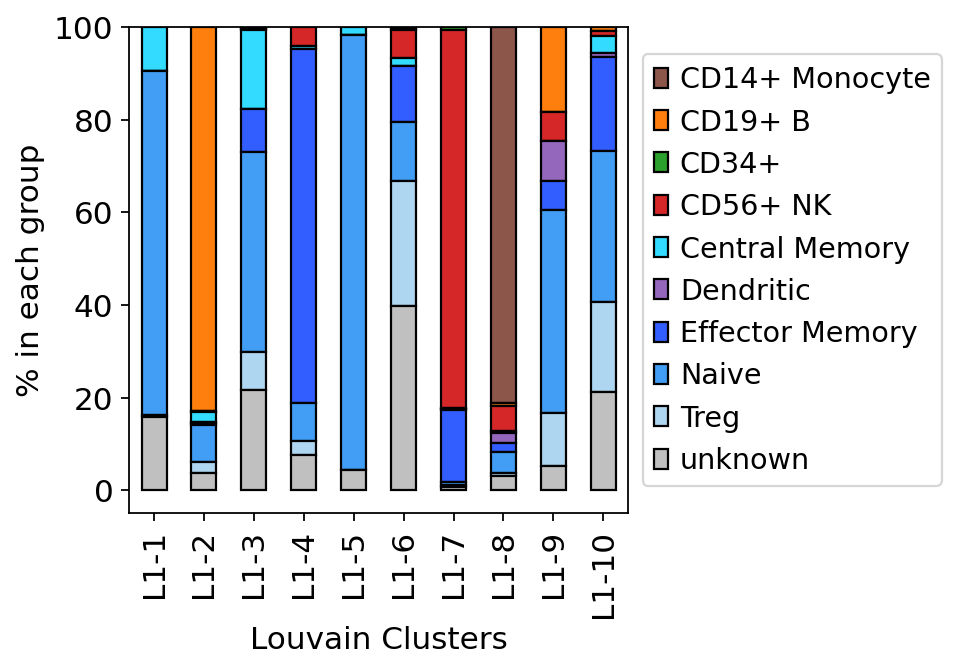

In [20]:
lv_stat_barplot(PBMC_data,hatch=False, xlab="Louvain Clusters", splitby="Louvain_Clusters", colorby="Proj_onto_bulk", color=PBMC_data.uns['Proj_onto_bulk_colors'])

## Figure 2D

In [21]:
CT = PBMC_data.obs['Proj_onto_bulk'].cat.categories[[4,6,7,8]]
for ct in CT:
    PBMC_data.obs['CT_'+ct] = np.in1d(PBMC_data.obs['Proj_onto_bulk'], ct)
    PBMC_data.obs['CT_'+ct] = PBMC_data.obs['CT_'+ct].astype('category')
    PBMC_data.uns['CT_'+ct+'_colors'] = ['#C0C0C0', '#ff0000']

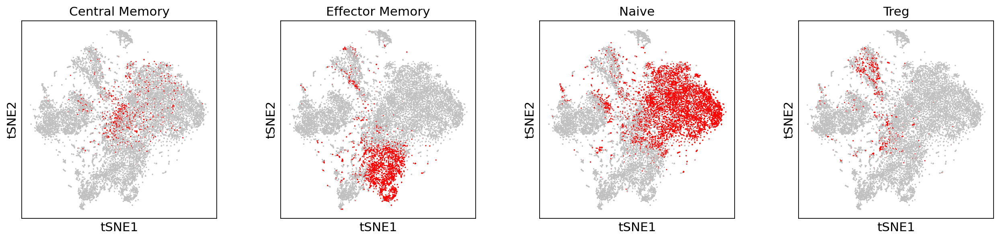

In [22]:
sc.pl.tsne(PBMC_data, color=['CT_'+x for x in CT], legend_loc='none', legend_fontsize=14, color_map=cmap, title=CT)

## Figure 2E

col_0,Negative,Positive
Louvain_Clusters,,
L1-1,2990,608
L1-2,2830,147
L1-3,2044,862
L1-4,731,1615
L1-5,1484,383
L1-6,998,393
L1-7,696,664
L1-8,415,37
L1-9,103,11


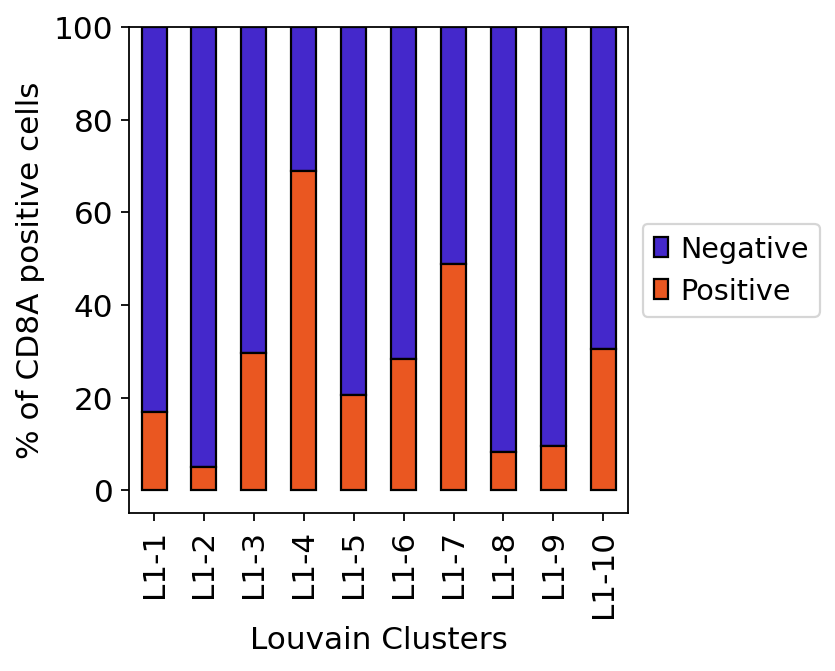

In [48]:
lv_stat_barplot(PBMC_data,  ylab="% of CD8A positive cells", xlab="Louvain Clusters",splitby="Louvain_Clusters", colorby="CD8A", hatch=False)

# Main Figure 3

## Figure 3A

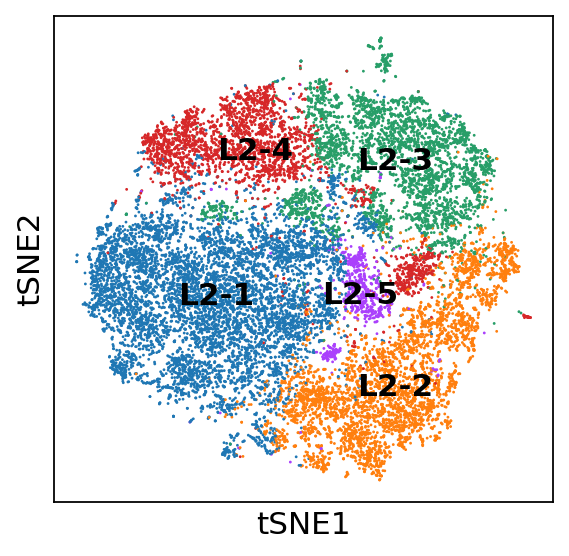

In [24]:
sc.pl.tsne(DT_data, color='Louvain_Clusters', legend_fontsize=14, legend_loc="on data", title="")

## Figure 3B

phase_comb,G1,G2M/S
Louvain_Clusters,,
L2-1,6437,1040
L2-2,2551,1622
L2-3,41,3699
L2-4,1993,841
L2-5,363,294


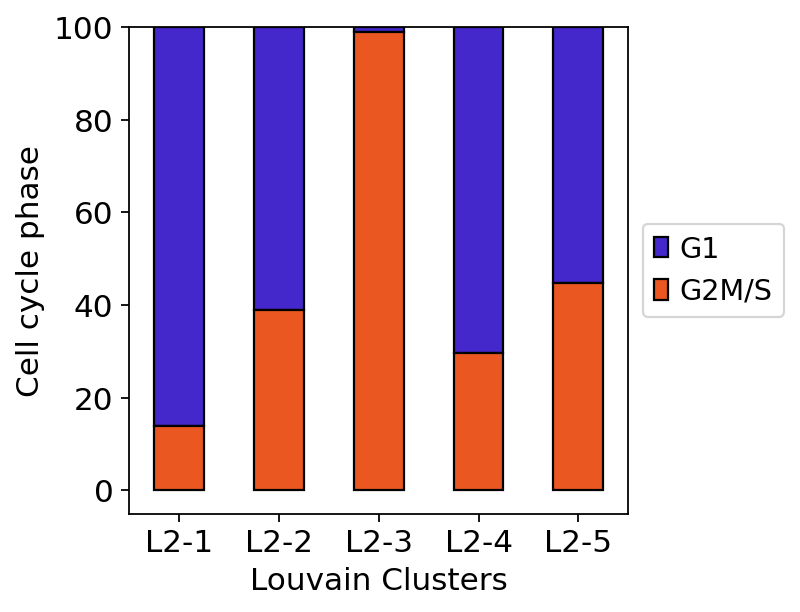

In [29]:
lv_stat_barplot(DT_data, ylab="Cell cycle phase", xlab="Louvain Clusters",splitby="Louvain_Clusters", colorby="phase_comb", hatch=False)

## Figure 3C

In [7]:
DT_data.obs['Project_onto_bulk_new'] = DT_data.obs['Project_onto_bulk_new'].astype('category')
DT_data.obs['Project_onto_bulk_new'] = DT_data.obs['Project_onto_bulk_new'].cat.reorder_categories(['CD8+_Central Memory', 'CD8+_Effector Memory',
                                                                                                   'CD8+_Naive', 'CD8+_Treg',
                                                                                                   'CD8+_Unassigned', 'CD8-_Central Memory',
                                                                                                   'CD8-_Effector Memory', 'CD8-_Naive',
                                                                                                   'CD8-_Treg', 'CD8-_Unassigned'])
DT_data.uns['Project_onto_bulk_new_colors'] = sc.pl.palettes.default_20[0:10]

Project_onto_bulk_new,CD8+_Central Memory,CD8+_Effector Memory,CD8+_Naive,CD8+_Treg,CD8+_Unassigned,CD8-_Central Memory,CD8-_Effector Memory,CD8-_Naive,CD8-_Treg,CD8-_Unassigned
Louvain_Clusters,,,,,,,,,,
L2-1,152,116,546,111,351,830,221,3038,491,1621
L2-2,9,296,22,212,90,49,1454,127,1475,439
L2-3,53,558,683,307,353,85,82,872,401,346
L2-4,80,854,1259,90,424,5,72,25,8,17
L2-5,5,57,53,31,23,26,116,102,153,91


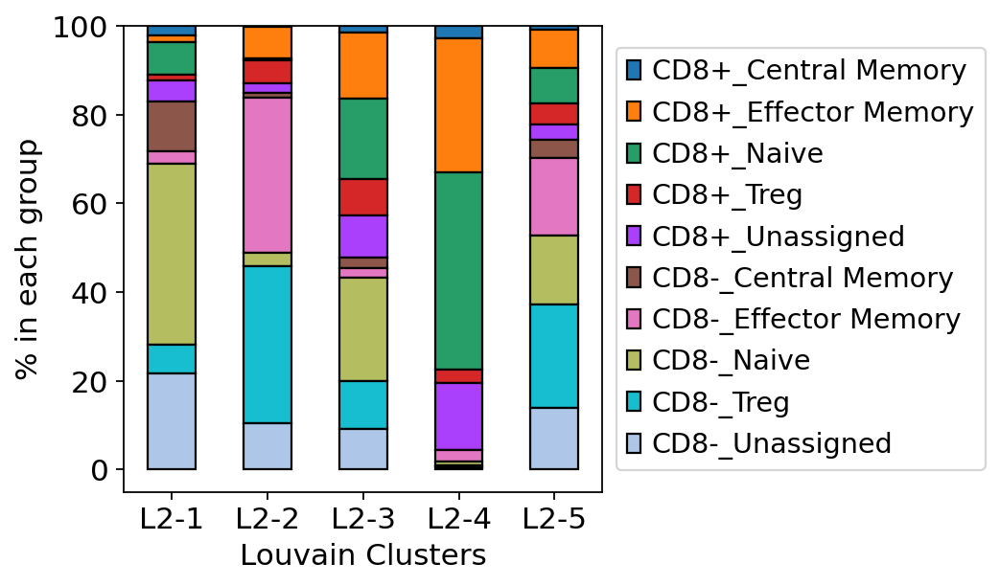

In [8]:
lv_stat_barplot(DT_data,color=DT_data.uns['Project_onto_bulk_new_colors'], ylab="% in each group", xlab="Louvain Clusters", splitby="Louvain_Clusters", colorby="Project_onto_bulk_new", hatch=False, save='Fig3C_new.pdf')

## Figure 3D

In [31]:
CT = DT_data.obs['Proj_onto_bulk'].cat.categories
for ct in CT:
    DT_data.obs['CT_'+ct] = np.in1d(DT_data.obs['Proj_onto_bulk'], ct)
    DT_data.obs['CT_'+ct] = DT_data.obs['CT_'+ct].astype('category')
    DT_data.uns['CT_'+ct+'_colors'] = ['#C0C0C0', '#ff0000']

... storing 'phase_comb' as categorical


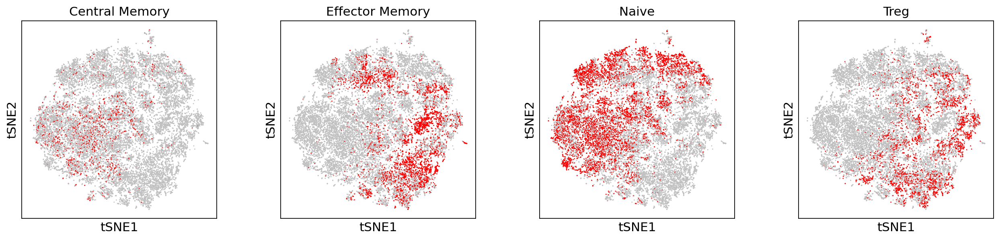

In [32]:
sc.pl.tsne(DT_data, color=['CT_'+x for x in CT][0:4], title=CT, legend_loc='')

## Figure 3E

In [27]:
from os import listdir
from os.path import isfile, join
DTcluster_dir = '../DEres/DT_cluster/'
onlyfiles = [f for f in listdir(DTcluster_dir) if ((isfile(join(DTcluster_dir, f))) & ('upG' in f))]
onlyfiles = np.sort(onlyfiles)
geneDEtop10 = np.concatenate([pd.read_csv(DTcluster_dir+f).iloc[0:10,:].values.flatten() for f in onlyfiles])
geneDEtop10 = ['PRF1' if x == 'CD8A' else x for x in geneDEtop10 ]

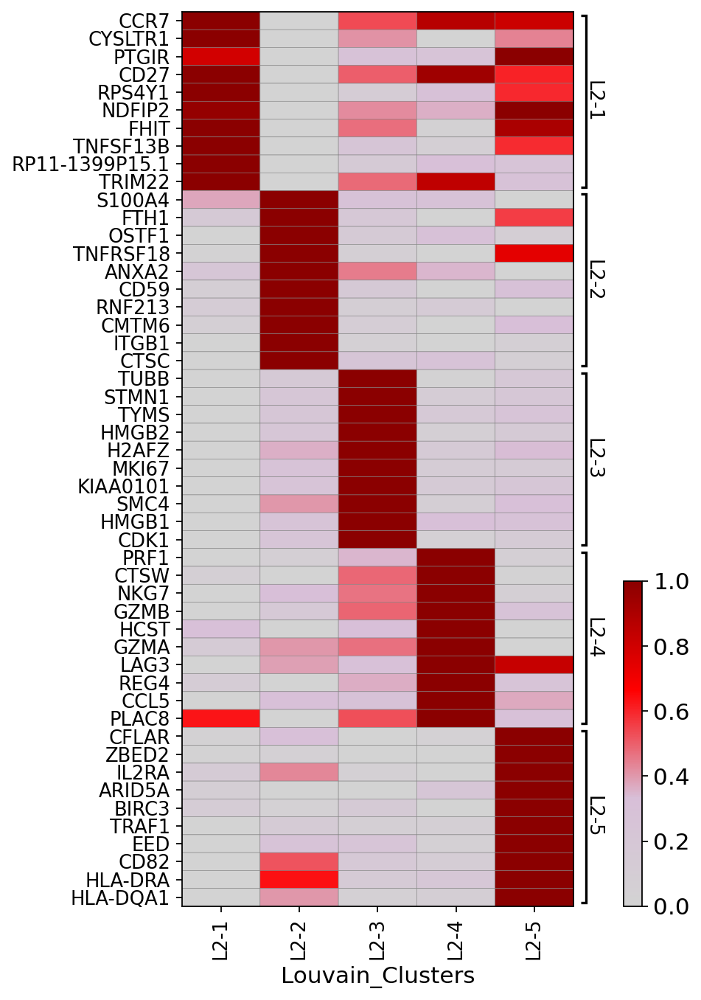

GridSpec(2, 3, height_ratios=[0, 10], width_ratios=[4.4, 0.4, 0.2])

In [28]:
from matplotlib.colors import LinearSegmentedColormap
cmap = LinearSegmentedColormap.from_list(name='gene_cmap', colors=['lightgrey', 'thistle', 'red', 'darkred']) 

gpos = [(0,9), (10,19), (20,29), (30,39), (40,49)]
glabel = DT_data.obs['Louvain_Clusters'].cat.categories
sc.pl.matrixplot(DT_data, geneDEtop10, groupby = 'Louvain_Clusters', 
                 dendrogram=False, swap_axes=True, standard_scale='var', cmap=cmap,
                var_group_positions = gpos,
                var_group_labels=glabel, figsize=(5,10))

## Figure 3F

(60, 4)


,Project_onto_bulk_new,Donor,value,Type
0,CD8+_Central Memory,Donor1,1.451999,Product
1,CD8+_Effector Memory,Donor1,5.603006,Product
2,CD8+_Naive,Donor1,12.521353,Product


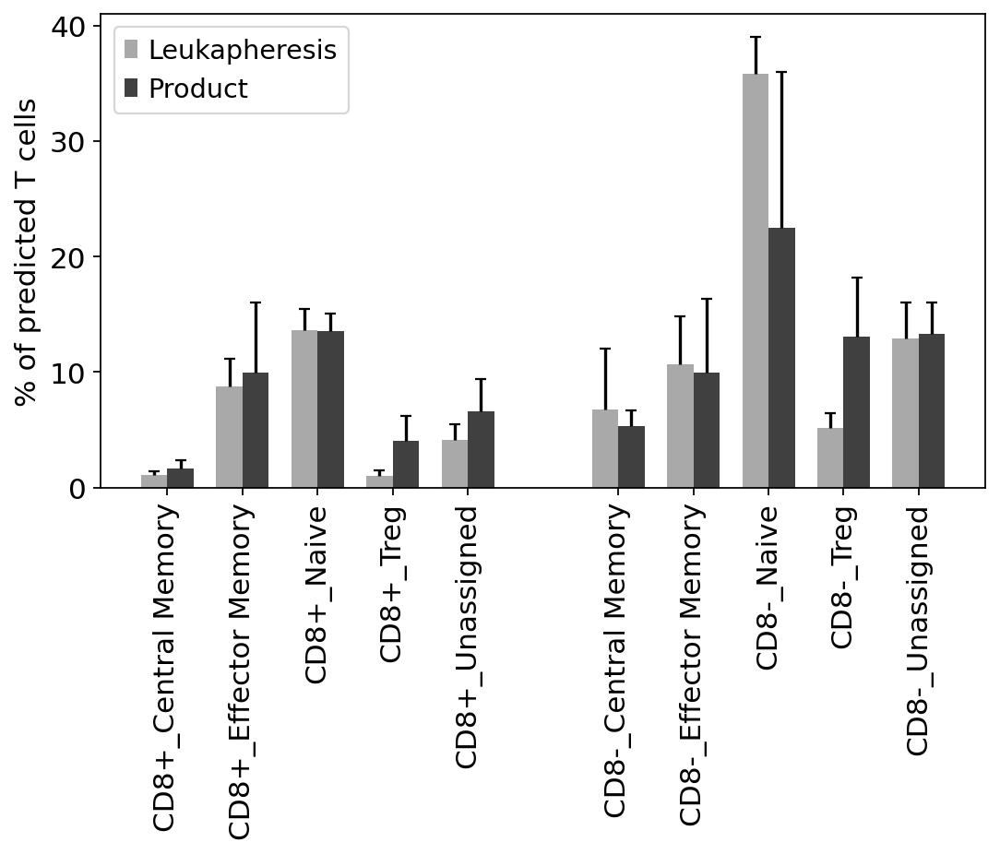

In [64]:
df_DT = pd.crosstab(DT_data.obs['Project_onto_bulk_new'], DT_data.obs['Donor'], normalize=1).rename(columns=str).reset_index().melt(id_vars='Project_onto_bulk_new', value_vars=['Donor1', 'Donor2', 'Donor3'])
df_DT['Type'] = ['Product']*df_DT.shape[0]
df_PBMC = pd.crosstab(Tcells_PBMC_data.obs['Project_onto_bulk_new'], Tcells_PBMC_data.obs['Donor'], normalize=1).rename(columns=str).reset_index().melt(id_vars='Project_onto_bulk_new', value_vars=['Donor1', 'Donor2', 'Donor3'])
df_PBMC['Type'] = ['Leukapheresis']*df_PBMC.shape[0]

df_comb = pd.concat([df_DT, df_PBMC], axis=0)
df_comb['value'] = df_comb['value']*100
df_comb['Type'] = df_comb['Type'].astype('category')
df_comb['Type'] = df_comb['Type'].cat.reorder_categories(['Leukapheresis', 'Product'])
print(df_comb.shape)
display(df_comb.head(3))
mean_all = df_comb.groupby(['Project_onto_bulk_new', 'Type'])['value'].mean().unstack()
std_all = df_comb.groupby(['Project_onto_bulk_new', 'Type'])['value'].std().unstack()

#import seaborn as sns
N = mean_all.shape[0]
ind = np.array([0,1,2,3,4,6,7,8,9,10])
width = 0.35
fig, ax = plt.subplots(figsize=(7,6))
ax1 = ax.bar(ind-width/2, mean_all['Leukapheresis'], width, color='#A9A9A9', label='Leukapheresis')
plotline1, caplines1, barlinecols1 = ax.errorbar(ind-width/2, mean_all['Leukapheresis'], yerr=std_all['Leukapheresis'], lolims=True,
        capsize = 0, ls='None', color='black')
caplines1[0].set_marker('_')
caplines1[0].set_markersize(5)
ax2 = ax.bar(ind+width/2, mean_all['Product'], width, color='#404040', label='Product')
plotline2, caplines2, barlinecols2 = ax.errorbar(ind+width/2, mean_all['Product'], yerr=std_all['Product'], lolims=True,
        capsize = 0, ls='None', color='black')
caplines2[0].set_marker('_')
caplines2[0].set_markersize(5)

ax.grid(False)
ax.xaxis.set_tick_params(rotation=90)
ax.set_xticks(ind)
ax.set_xticklabels(mean_all.index)
ax.set_ylabel('% of predicted T cells')
ax.legend()
plt.tight_layout()

## Figure 3G

Vector_binary,Negative,Positive
Louvain_Clusters,,
L2-1,5699,1778
L2-2,3285,888
L2-3,2525,1215
L2-4,2358,476
L2-5,162,495


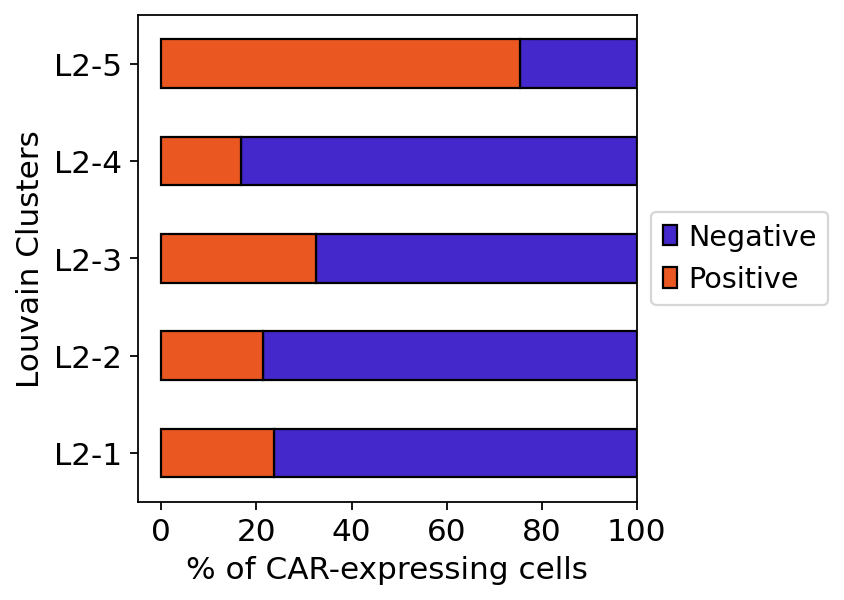

In [77]:
lv_stat_barplot(DT_data, xlab="Louvain Clusters", ylab="% of CAR-expressing cells", splitby="Louvain_Clusters", colorby="Vector_binary", orientation="horizontal", hatch=False)

## Figure 3H

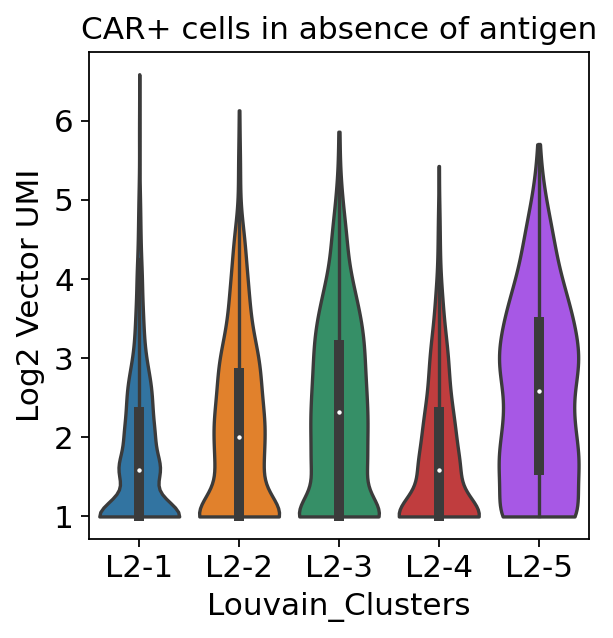

In [80]:
ax = sns.violinplot(x='Louvain_Clusters', y='Vector', cut=0, scale='width',data=DT_data[DT_data.obs['Vector_binary']=='Positive',:].obs)
ax.set_ylabel("Log2 Vector UMI")
ax.set_title("CAR+ cells in absence of antigen")
ax.grid(False)

# Main Figure 4

## Figure 4A

... storing 'phase_comb' as categorical


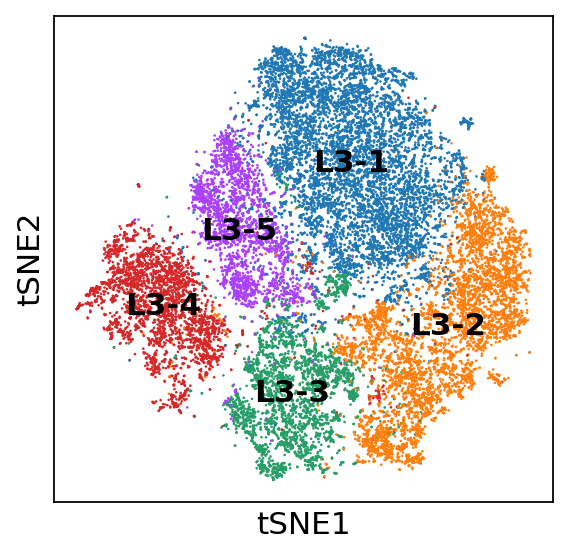

In [81]:
sc.pl.tsne(DS_data, color='Louvain_Clusters', legend_loc='on data', legend_fontsize=14, title='')

## Figure 4B

Vector_binary,Negative,Positive
Louvain_Clusters,,
L3-1,6581,1085
L3-2,4535,643
L3-3,2589,550
L3-4,886,2218
L3-5,2422,167


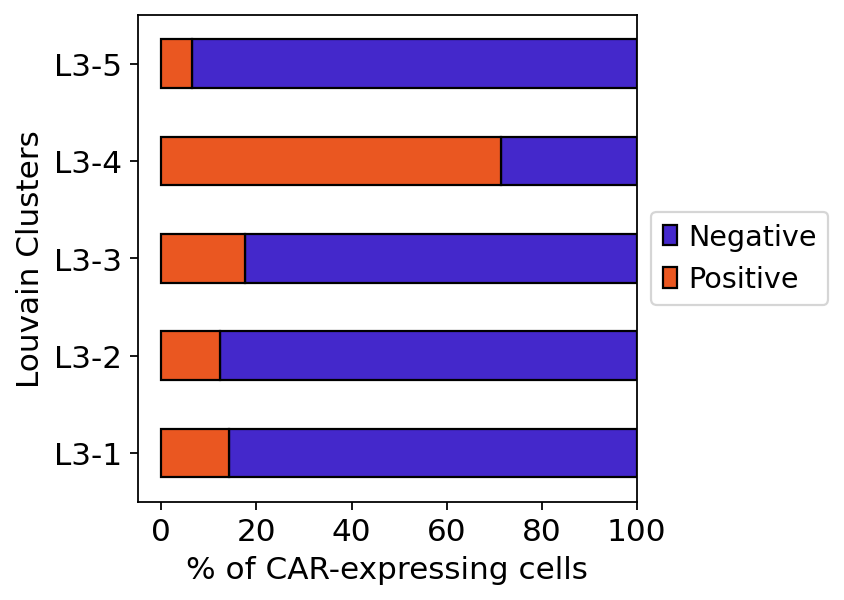

In [83]:
lv_stat_barplot(DS_data, xlab="Louvain Clusters", ylab="% of CAR-expressing cells", splitby="Louvain_Clusters", colorby="Vector_binary", orientation="horizontal", hatch=False)

## Figure 4C

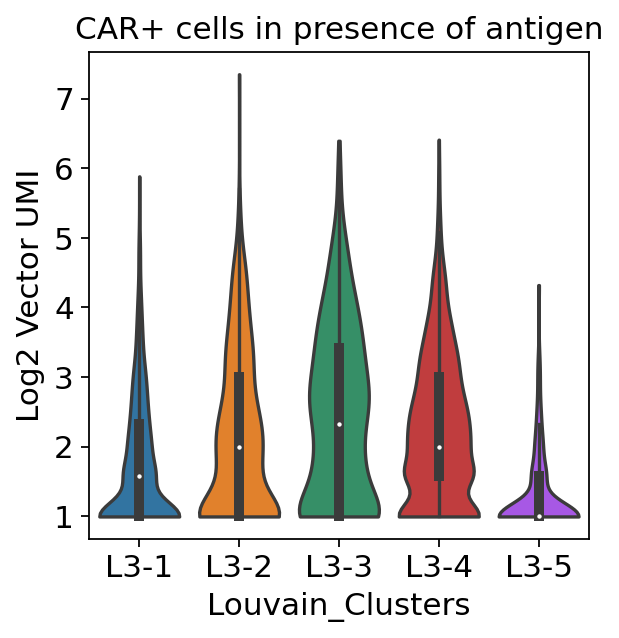

In [84]:
ax = sns.violinplot(x='Louvain_Clusters', y='Vector', cut=0, scale='width',data=DS_data[DS_data.obs['Vector_binary']=='Positive',:].obs)
ax.set_ylabel("Log2 Vector UMI")
ax.set_title("CAR+ cells in presence of antigen")
ax.grid(False)

## Figure 4D

... storing 'phase_comb' as categorical


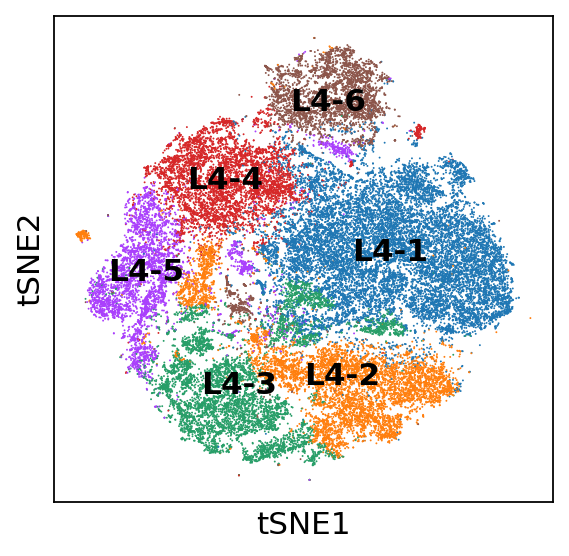

In [85]:
sc.pl.tsne(Tcells_data, color=['Louvain_Clusters'], legend_loc='on data', legend_fontsize=14, title='')

## Figure 4E

Condition,+Antigen,-Antigen
Louvain_Clusters,,
L4-1,7142,7138
L4-2,3213,3432
L4-3,3298,3065
L4-4,2406,2810
L4-5,2349,1909
L4-6,3268,527


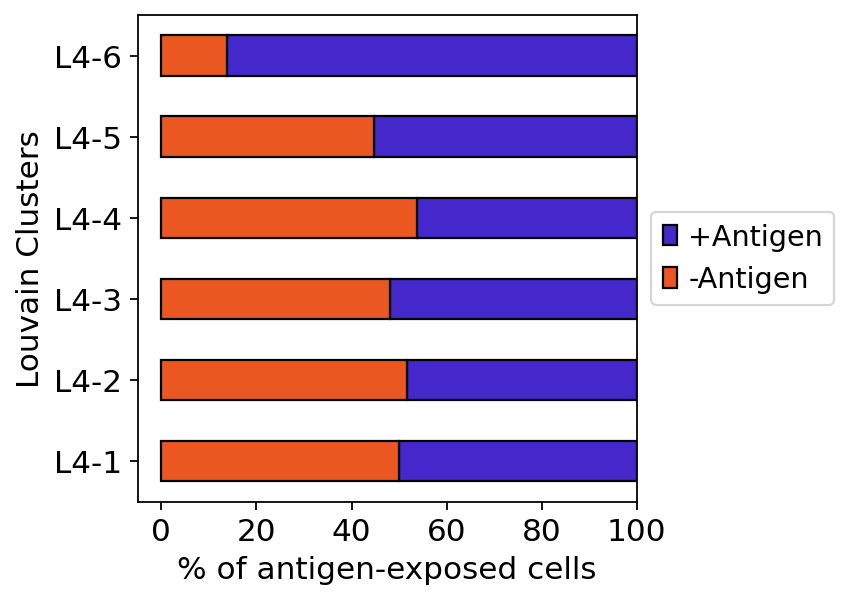

In [91]:
lv_stat_barplot(Tcells_data, xlab="Louvain Clusters",ylab="% of antigen-exposed cells", splitby="Louvain_Clusters", colorby="Condition", orientation="horizontal", hatch=False)

## Figure 4F

Vector_binary,Negative,Postive
Louvain_Clusters,,
L4-1,11650,2630
L4-2,5738,907
L4-3,4801,1562
L4-4,4403,813
L4-5,3321,937
L4-6,1129,2666


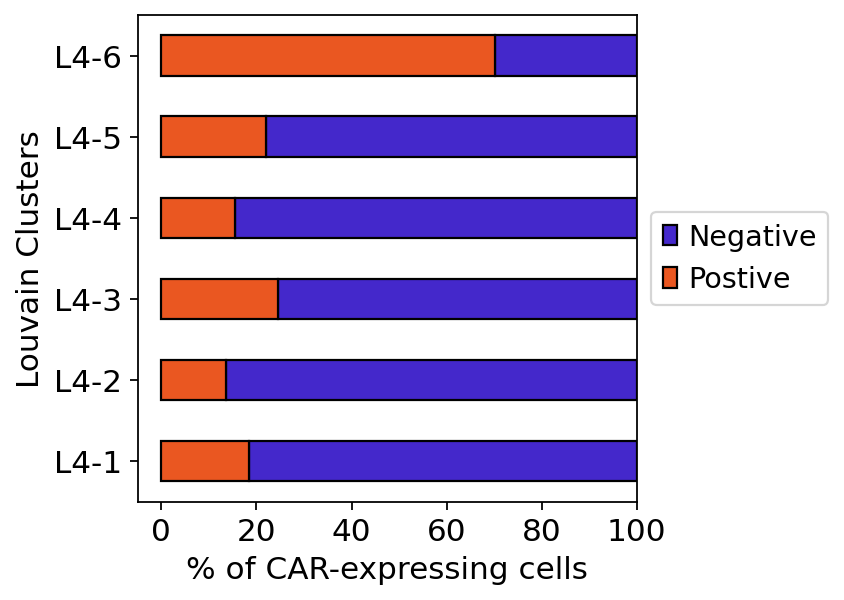

In [95]:
lv_stat_barplot(Tcells_data, xlab="Louvain Clusters", ylab="% of CAR-expressing cells", splitby="Louvain_Clusters", colorby="Vector_binary", orientation="horizontal", hatch=False)

## Figure 4G

... storing 'phase_comb' as categorical


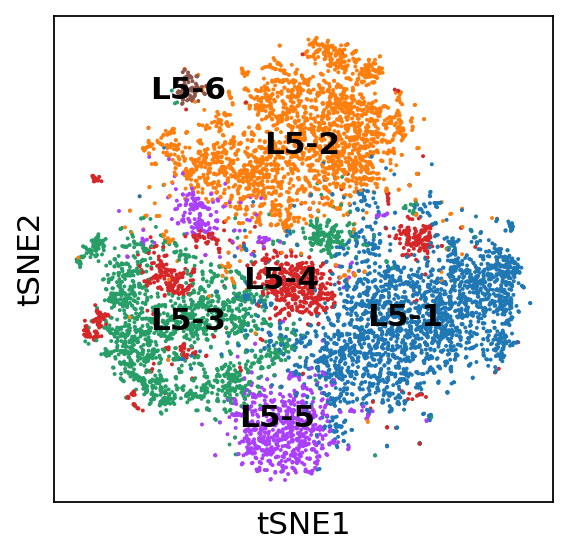

In [96]:
sc.pl.tsne(VP_data, color='Louvain_Clusters', title='', legend_loc='on data', legend_fontsize=14)

## Figure 4H

Condition,+Antigen,-Antigen
Louvain_Clusters,,
L5-1,1049,1697
L5-2,2309,329
L5-3,658,1357
L5-4,312,749
L5-5,265,672
L5-6,70,48


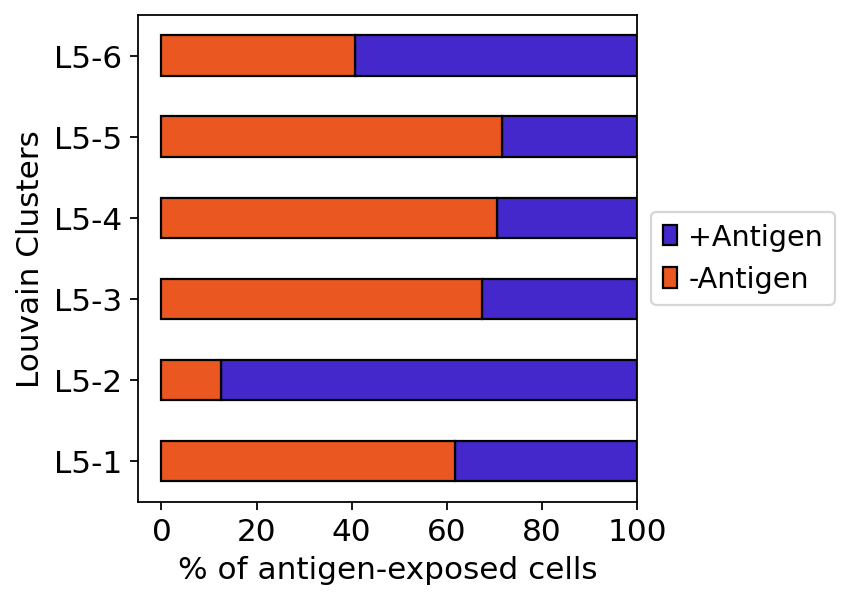

In [99]:
lv_stat_barplot(VP_data, xlab="Louvain Clusters",ylab="% of antigen-exposed cells", splitby="Louvain_Clusters", colorby="Condition", orientation="horizontal", hatch=False)

## Figure 4I

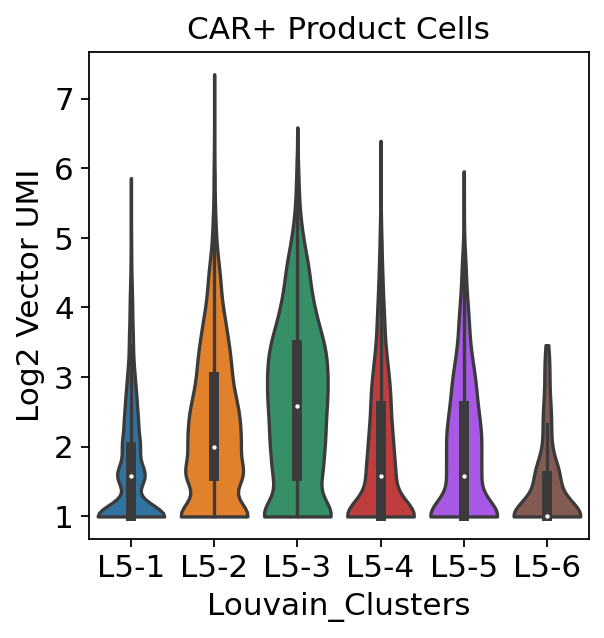

In [100]:
ax = sns.violinplot(x='Louvain_Clusters', y='Vector', cut=0, scale='width',data=VP_data.obs)
ax.set_ylabel("Log2 Vector UMI")
ax.set_title("CAR+ Product Cells")
ax.grid(False)

## Figure 4K

[1] 196   6


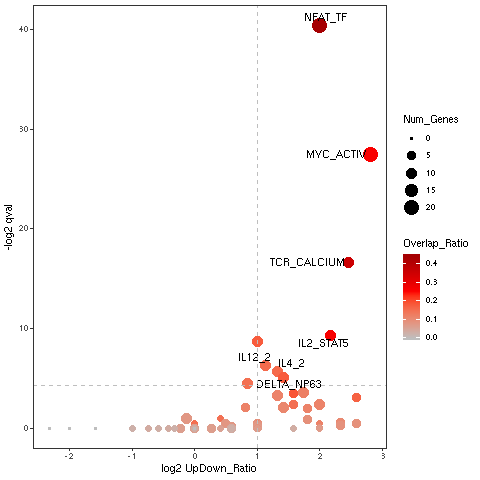

In [8]:
%%R 
# Ignore this Fernando does not like it
require("qusage")
require("ggplot2")
require("ggrepel")

tab = read.table('L5_2_hypertab_c2_PID.csv', sep=',', header=T)
db = read.gmt('./c2.cp.pid.v7.0.symbols.gmt')
print(dim(tab))
upG = read.csv('./DEres/VP_Sti_cluster/cL5-2vsAll_upG.txt', header=F)[,1]
downG = read.csv('./DEres/VP_Sti_cluster/cL5-2vsAll_downG.txt', header=F)[,1]

qval_cutoff = 0.05
freqFC = unlist(lapply(tab[,1], function(x){
    overlapUP = length(intersect(upG, db[[match(x, names(db))]]))
    overlapDOWN = length(intersect(downG, db[[match(x, names(db))]]))
    freqpn = (overlapUP+1)/(overlapDOWN+1)
    return(freqpn)
}))
Term = gsub("PID_(.*)PATHWAY", "\\1", tab[,1])
Term = gsub("(.*)_$", "\\1", Term)
Ftab = data.frame(Term=Term, qval=-log2(tab[,6]), Num_Genes=tab[,2], UpDown_Ratio=log2(freqFC), Overlap_Ratio=tab[,3])
                    
p <- ggplot(Ftab, aes(x=UpDown_Ratio, y=qval))+geom_point(aes(size=Num_Genes, color=Overlap_Ratio))
p <- p + scale_colour_gradient2(low='grey', mid='red', high='dark red',midpoint=0.25)
p <- p + ylab('-log2 qval')
p <- p + xlab('log2 UpDown_Ratio')
p <- p + geom_text_repel(data=subset(Ftab, qval > -log2(qval_cutoff) & UpDown_Ratio > 1),
                         aes(label=Term)
)
p <- p + theme_bw() + theme(plot.background = element_blank(),
    panel.grid.major = element_blank(),
    panel.grid.minor = element_blank())
p <- p + geom_hline(yintercept = -log2(qval_cutoff),linetype = "dashed", color='grey')
p <- p + geom_vline(xintercept = 1,linetype = "dashed", color='grey')
p

# Main Figure 5

## Figure 5C

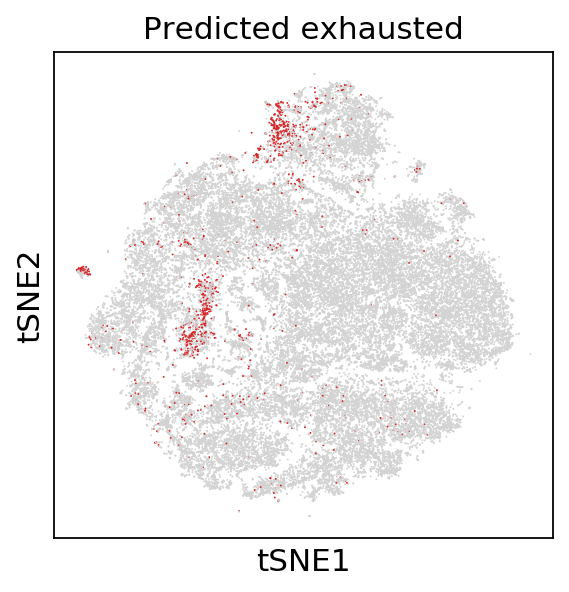

In [11]:
sc.pl.tsne(Tcells_data, color=['Ex_Score'],title='Predicted exhausted', legend_loc='none', legend_fontsize=14)

## Figure 5D

In [12]:
Ex_genes = ['LAG3', 'HAVCR2', 'CTLA4', 'TIGIT', 'TBX21', 'Vector']
g1 = Tcells_data.obs_names[(Tcells_data.obs['Louvain_Clusters']=='L4-6') & (Tcells_data.obs['Condition']=='+Antigen') & (Tcells_data.obs['Vector']>0) & (Tcells_data.obs['Ex_Score']=='Exhausted')]
g2 = Tcells_data.obs_names[(Tcells_data.obs['Louvain_Clusters']=='L4-6') & (Tcells_data.obs['Condition']=='+Antigen') & (Tcells_data.obs['Vector']>0) & (Tcells_data.obs['Ex_Score']!='Exhausted')]
print(len(g1))
print(len(g2))
Tcells_data_sub = Tcells_data[np.append(g1,g2),:]

255
2065


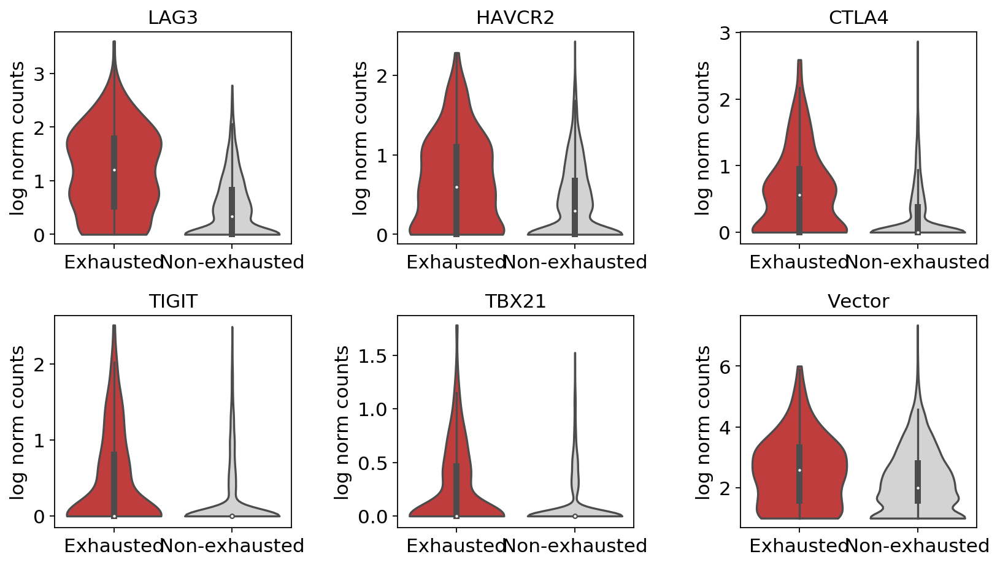

In [17]:
TenX_violinplot(Tcells_data_sub, keys=Ex_genes, ncols=3,colorby='Ex_Score', colors=['#d62728', '#d3d3d3'])

# Supplementary Figure 1

## SFigure 1A

In [19]:
Monocyte_genes = ['FTL', 'S100A8', 'CD14']
NK_genes = ['GNLY', 'NKG7']
Bcell_genes = ['CD19', 'CD79A']
Tcell_genes = ['CD3D', 'CD8A', 'CD4']

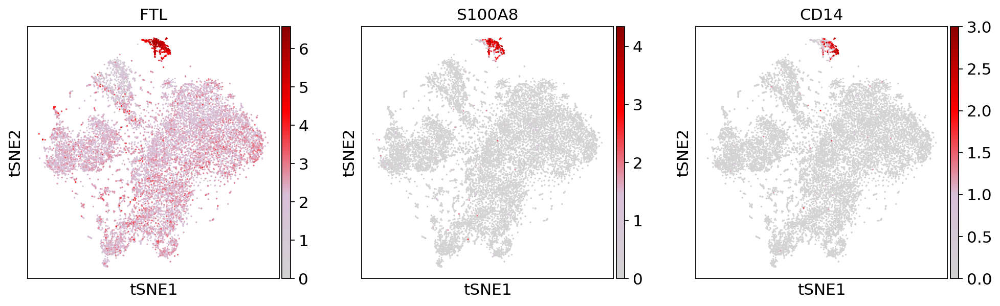

In [21]:
sc.pl.tsne(PBMC_data, color=Monocyte_genes, legend_loc='on data', color_map=cmap, legend_fontsize=14, ncols=3)

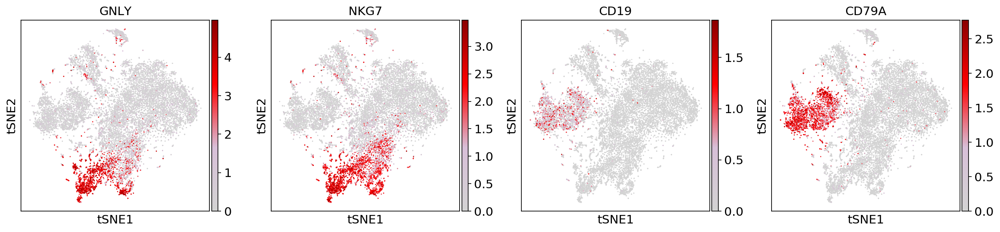

In [22]:
sc.pl.tsne(PBMC_data, color=NK_genes+Bcell_genes, legend_loc='on data', color_map=cmap, legend_fontsize=14, ncols=4)

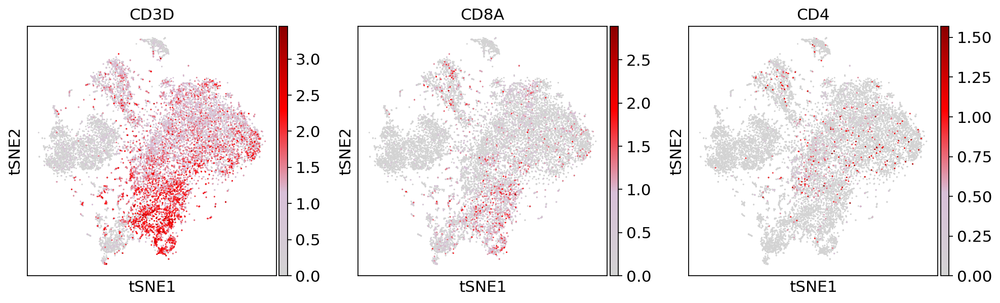

In [23]:
sc.pl.tsne(PBMC_data, color=Tcell_genes, legend_loc='on data', color_map=cmap, legend_fontsize=14, ncols=3)

## SFigure 1C

Proj_onto_bulk,CD14+ Monocyte,CD19+ B,CD34+,CD56+ NK,Central Memory,Dendritic,Effector Memory,Naive,Treg,unknown
Donor,,,,,,,,,,
Donor1,354,842,6,294,574,23,520,1785,262,893
Donor2,11,669,8,560,205,1,927,2577,368,689
Donor3,6,994,4,477,202,2,1054,2038,182,592


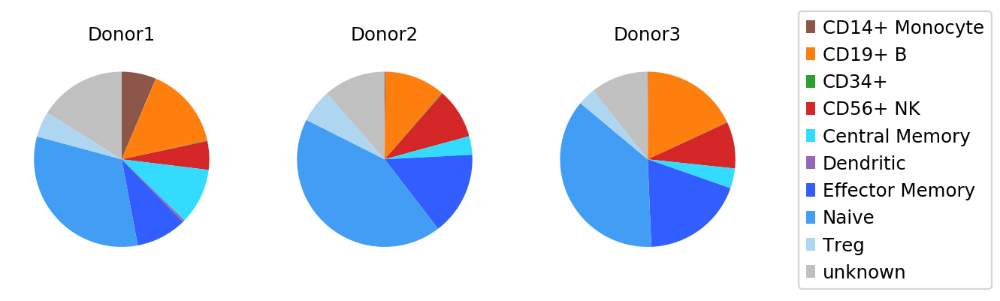

In [24]:
lv_stat_barplot(PBMC_data, fontsize=11, splitby="Donor", colorby="Proj_onto_bulk", plotMethod="PieChart", color=PBMC_data.uns['Proj_onto_bulk_colors'])

# Supplementary Figure 2

## SFigure 2A

col_0,Negative,Positive
Louvain_Clusters,,
L2-1,6833,644
L2-2,3848,325
L2-3,2161,1579
L2-4,341,2493
L2-5,554,103


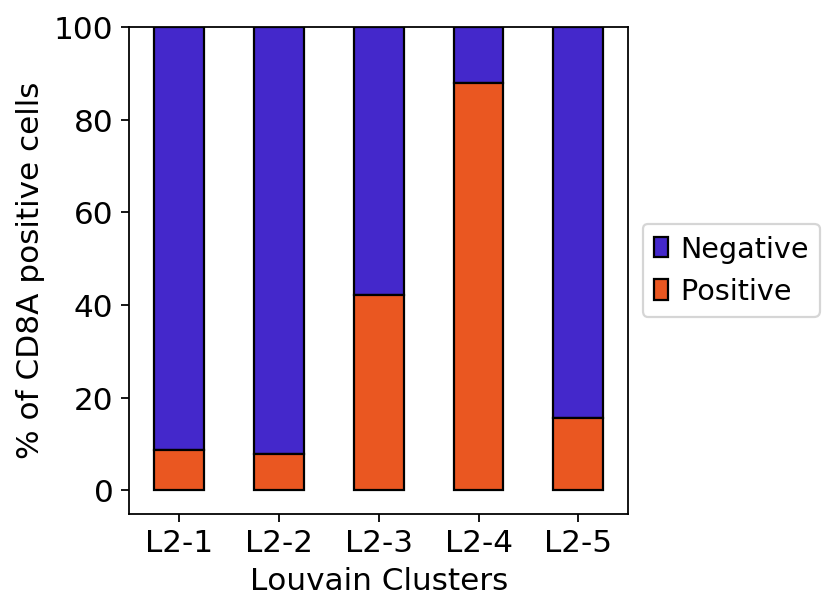

In [25]:
lv_stat_barplot(DT_data, ylab="% of CD8A positive cells", xlab="Louvain Clusters", splitby="Louvain_Clusters", colorby="CD8A", hatch=False)

## SFigure 2B

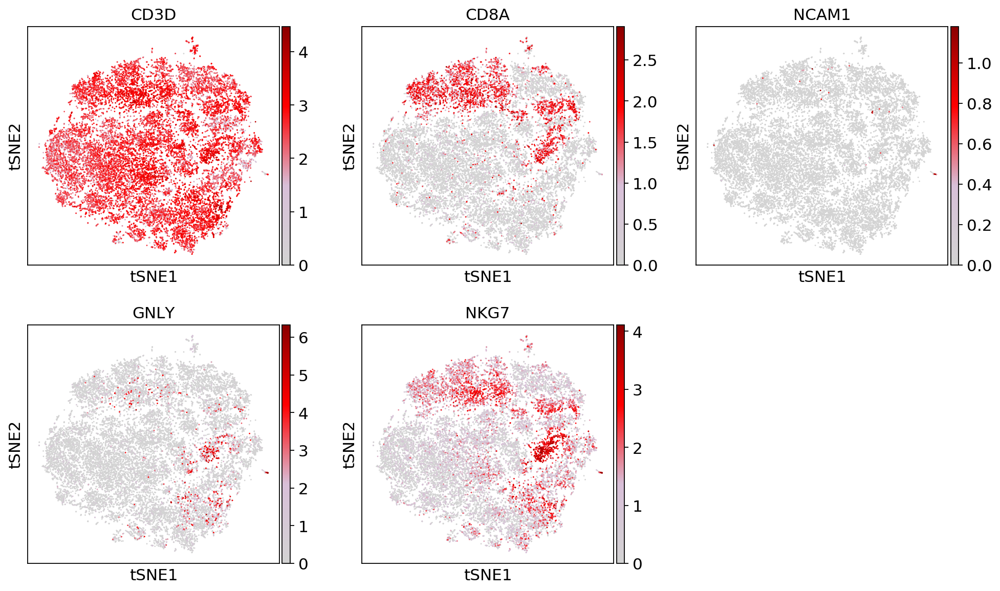

In [26]:
sc.pl.tsne(DT_data, color=['CD3D', 'CD8A', 'NCAM1', 'GNLY', 'NKG7'], ncols=3,legend_fontsize=14, color_map=cmap)

## SFigure 2C

Louvain_Clusters,L2-1,L2-2,L2-3,L2-4,L2-5
Proj_onto_bulk,,,,,
Central Memory,982,58,138,85,31
Effector Memory,337,1750,640,926,173
Naive,3584,149,1555,1284,155
Treg,602,1687,708,98,184
Unassigned,1972,529,699,441,114


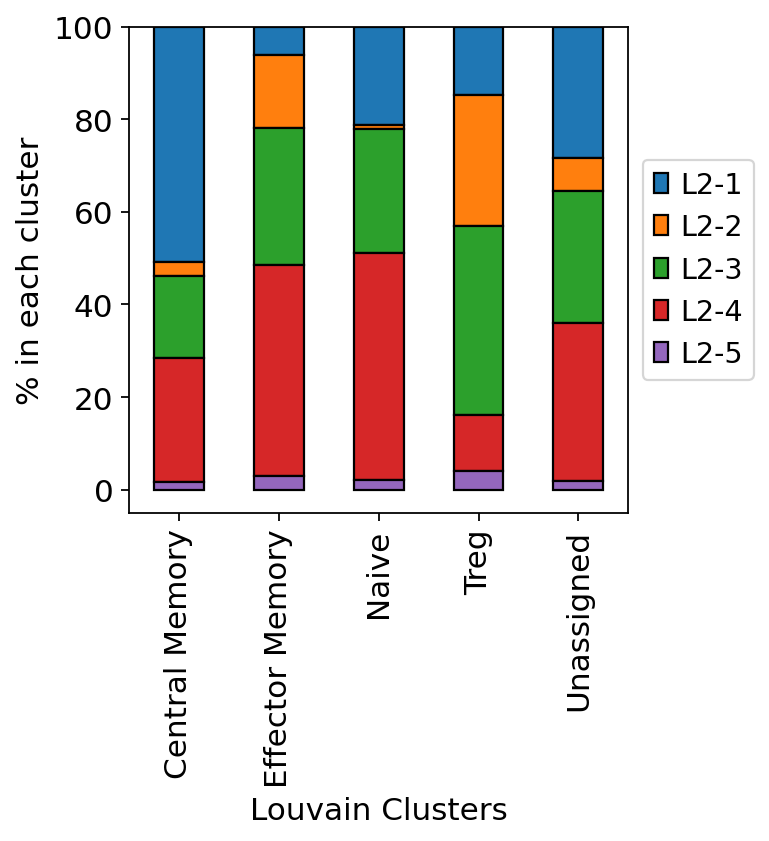

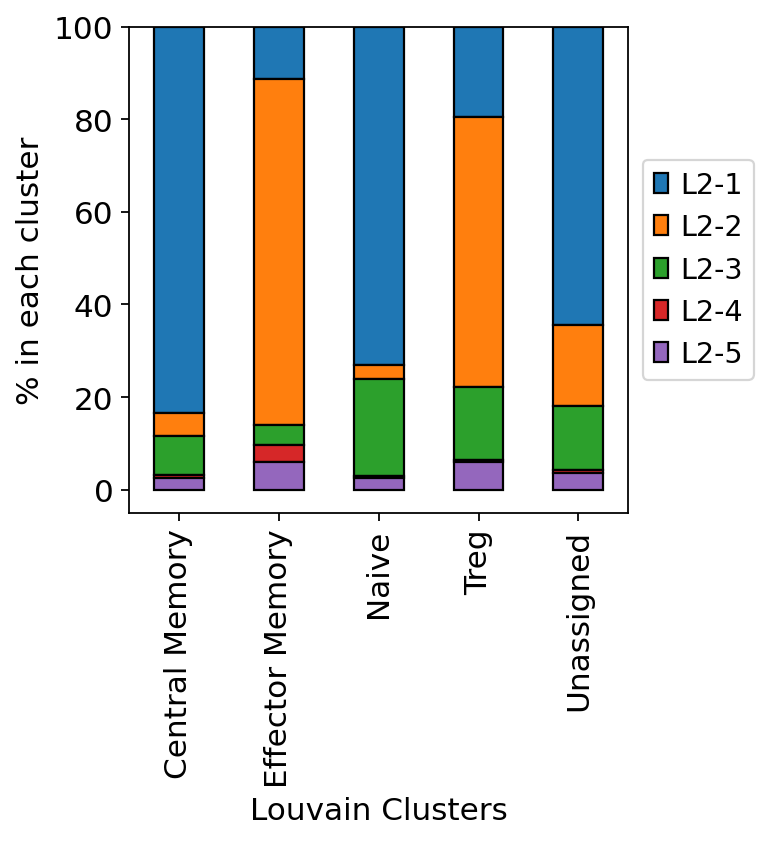

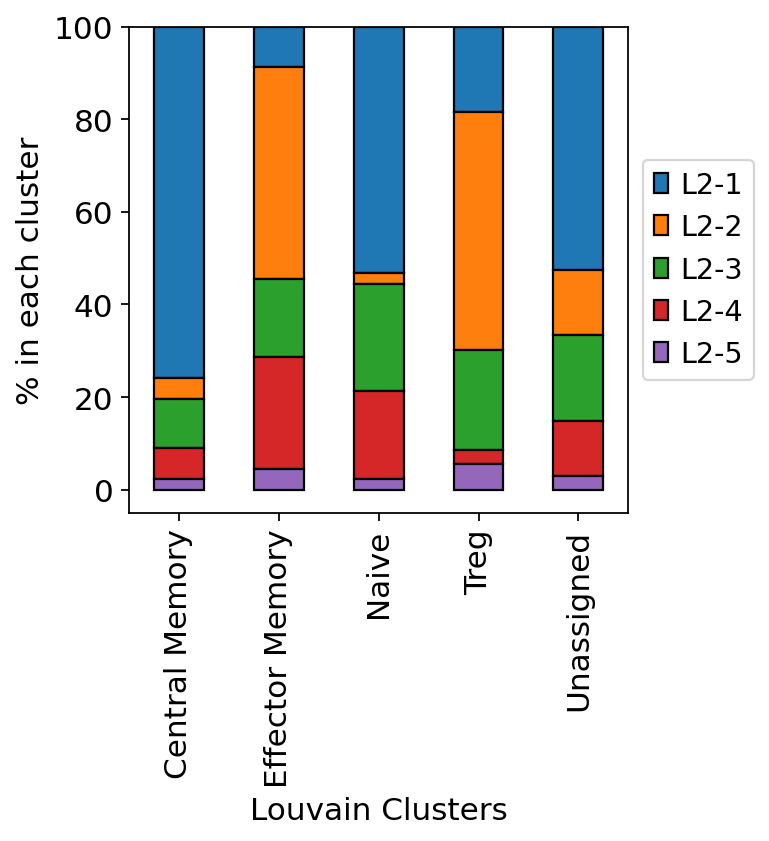

In [30]:
DT_data_CD8pos = DT_data[['CD8+' in x for x in DT_data.obs['Project_onto_bulk_new']]]
lv_stat_barplot(DT_data_CD8pos,ylab="% in each cluster", xlab="Louvain Clusters", splitby="Proj_onto_bulk", colorby="Louvain_Clusters", hatch=False)

DT_data_CD8neg = DT_data[['CD8-' in x for x in DT_data.obs['Project_onto_bulk_new']]]
lv_stat_barplot(DT_data_CD8neg, ylab="% in each cluster", xlab="Louvain Clusters", splitby="Proj_onto_bulk", colorby="Louvain_Clusters", hatch=False)

lv_stat_barplot(DT_data,ylab="% in each cluster", xlab="Louvain Clusters", splitby="Proj_onto_bulk", colorby="Louvain_Clusters", hatch=False)

## SFigure 2D

In [28]:
from os import listdir
from os.path import isfile, join
DTcluster_dir = './DEres/DT_cluster/'
onlyfiles = [f for f in listdir(DTcluster_dir) if ((isfile(join(DTcluster_dir, f))) & ('upG' in f))]
geneDEtop10 = np.concatenate([pd.read_csv(DTcluster_dir+f).iloc[0:10,:].values.flatten() for f in onlyfiles])
geneDEtop10 = ['PRF1' if x == 'CD8A' else x for x in geneDEtop10 ]

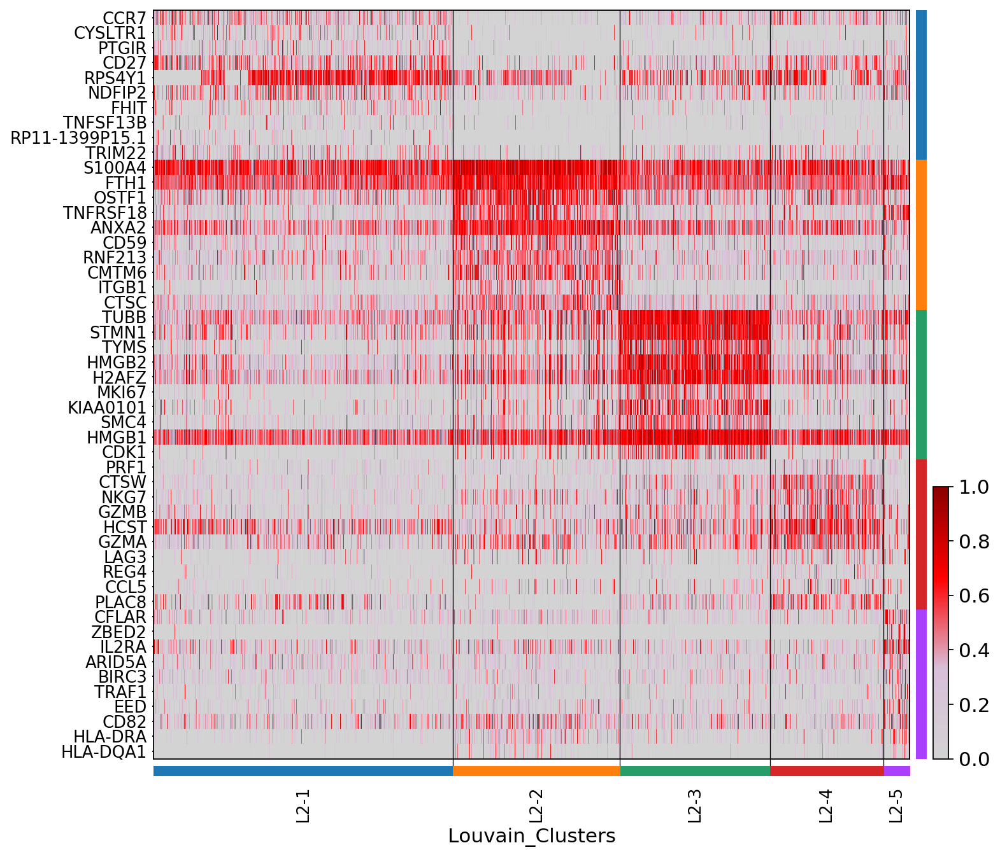

GridSpec(3, 3, height_ratios=[0, 9.87, 0.13], width_ratios=[10, 0.14, 0.2])

In [30]:
gpos = [(0,9), (10,19), (20,29), (30,39), (40,49)]
glabel = DT_data.obs['Louvain_Clusters'].cat.categories

sc.pl.heatmap(DT_data, geneDEtop10, groupby = 'Louvain_Clusters', 
                 dendrogram=False, swap_axes=True, standard_scale='var', cmap=cmap,
                var_group_positions = gpos,
                var_group_labels=glabel,figsize=(10,10))

## SFigure 2E

Donor,Donor1,Donor2,Donor3
Louvain_Clusters,,,
L2-1,3348,1772,2357
L2-2,124,1533,2516
L2-3,1588,1556,596
L2-4,588,1206,1040
L2-5,206,81,370


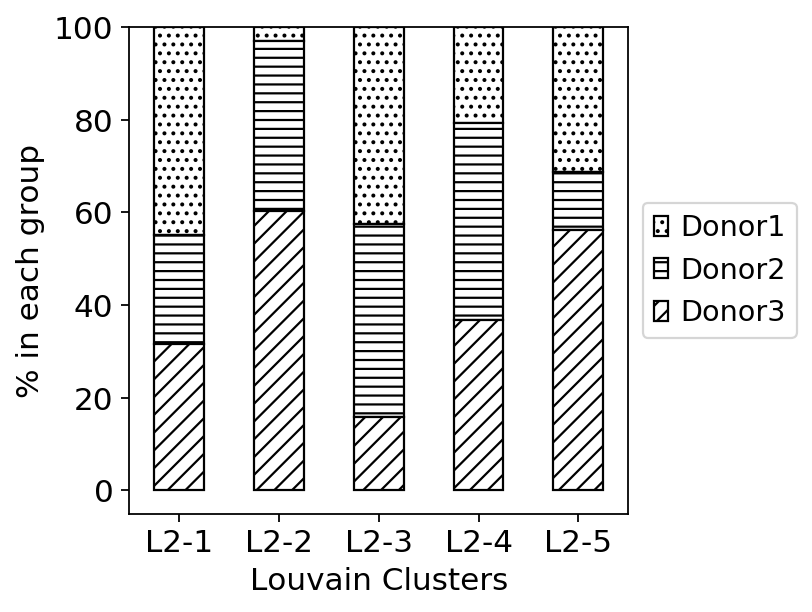

In [31]:
lv_stat_barplot(DT_data, xlab="Louvain Clusters", splitby="Louvain_Clusters", colorby="Donor", color='white')

## SFigure 2E

Project_onto_bulk_new,CD8+_Central Memory,CD8+_Effector Memory,CD8+_Naive,CD8+_Treg,CD8+_Unassigned,CD8-_Central Memory,CD8-_Effector Memory,CD8-_Naive,CD8-_Treg,CD8-_Unassigned
Donor,,,,,,,,,,
Donor1,85,328,733,154,291,401,209,2216,522,915
Donor2,150,1036,941,403,602,293,611,757,717,638
Donor3,64,517,889,194,348,301,1125,1191,1289,961


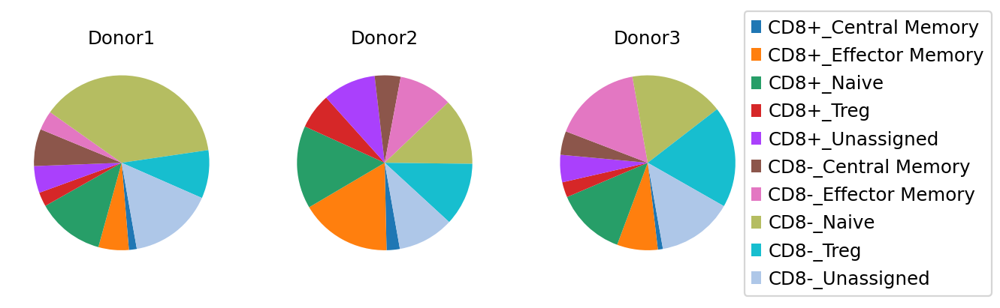

In [12]:
lv_stat_barplot(DT_data, color=DT_data.uns['Project_onto_bulk_new_colors'], splitby="Donor", colorby="Project_onto_bulk_new", plotMethod="PieChart", startangle=-80,save='SFig2E.pdf')

# Supplementary Figure 3

## SFigure 3A

In [33]:
Tcells_raw = sc.read('./write_new/Tcells_raw_afterQC.h5ad')

In [34]:
gene_mean = np.array([])
for column in Tcells_raw.X.T:
    if np.sum(column) != 0:
        gene_mean = np.append(gene_mean,np.mean(column[column!=0]))
gene_mean = np.log2(gene_mean)

In [35]:
vec = Tcells_data.obs['Vector']
vec_mean = np.mean(vec[vec!=0])
CD8A = Tcells_raw[:, 'CD8A'].X.flatten()
CD8A_mean = np.mean(CD8A[CD8A!=0])
CD4 = Tcells_raw[:, 'CD4'].X.flatten()
CD4_mean = np.mean(CD4[CD4!=0])
CD3D = Tcells_raw[:, 'CD3D'].X.flatten()
CD3D_mean = np.mean(CD3D[CD3D!=0])

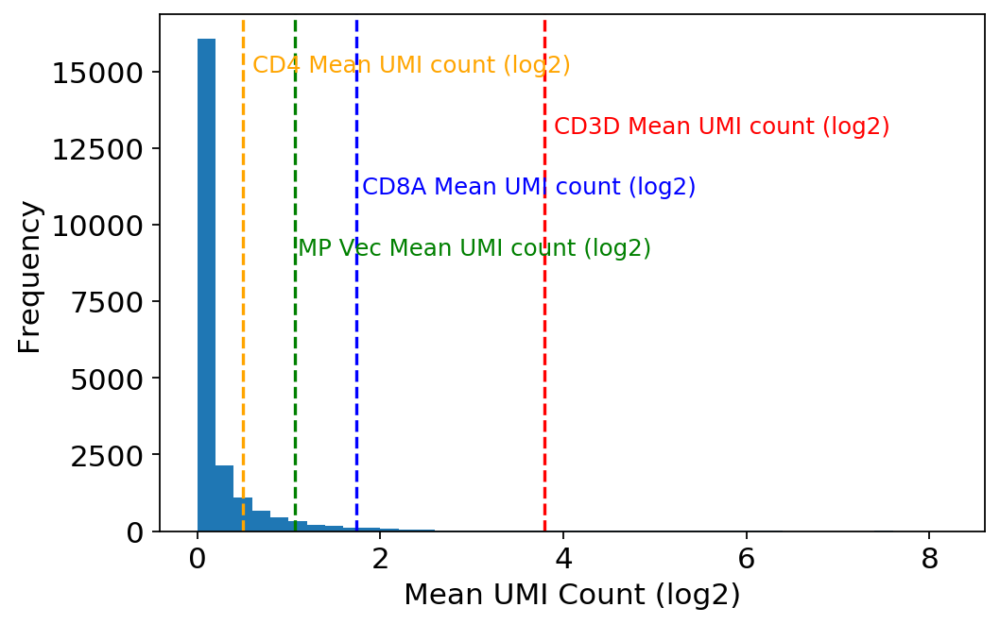

In [36]:
plt.figure(figsize=(7,4.5))
plt.hist(gene_mean, bins=np.arange(min(gene_mean), max(gene_mean) + 0.2, 0.2))
plt.xlabel("Mean UMI Count (log2)")
plt.ylabel("Frequency")
plt.axvline(np.log2(vec_mean), color='green', linestyle='--')
plt.axvline(np.log2(CD8A_mean), color='blue', linestyle='--')
plt.axvline(np.log2(CD3D_mean), color='red', linestyle='--')
plt.axvline(np.log2(CD4_mean), color='orange', linestyle='--')
plt.text(1.1, 9000, 'MP Vec Mean UMI count (log2)',
        color='green', fontsize=11)
plt.text(1.8, 11000, 'CD8A Mean UMI count (log2)',
        color='blue', fontsize=11)
plt.text(3.9, 13000, 'CD3D Mean UMI count (log2)',
        color='red', fontsize=11)
plt.text(0.6, 15000, 'CD4 Mean UMI count (log2)',
        color='orange', fontsize=11)
plt.xlabel('Mean UMI Count (log2)')
plt.ylabel('Frequency')
plt.grid(False)

## SFigure 3B

In [37]:
gene_max = np.array([])
for column in Tcells_raw.X.T:
    if np.sum(column) != 0:
        gene_max = np.append(gene_max,np.max(column[column!=0]))
gene_max = np.log2(gene_max)

In [38]:
vec_max = np.max(vec[vec!=0])
CD8A_max = np.max(CD8A[CD8A!=0])
CD4_max = np.max(CD4[CD4!=0])
CD3D_max = np.max(CD3D[CD3D!=0])

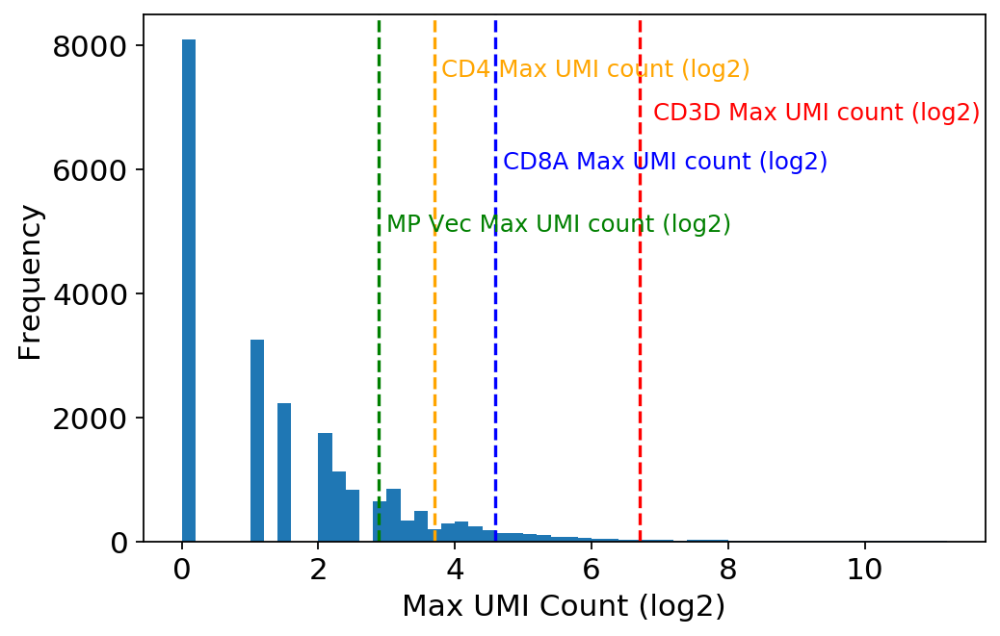

In [39]:
plt.figure(figsize=(7,4.5))
plt.hist(gene_max, bins=np.arange(min(gene_max), max(gene_max) + 0.2, 0.2))
plt.xlabel("Max UMI Count (log2)")
plt.ylabel("Frequency")
plt.axvline(np.log2(vec_max), color='green', linestyle='--')
plt.axvline(np.log2(CD8A_max), color='blue', linestyle='--')
plt.axvline(np.log2(CD3D_max), color='red', linestyle='--')
plt.axvline(np.log2(CD4_max), color='orange', linestyle='--')
plt.text(3, 5000, 'MP Vec Max UMI count (log2)',
        color='green', fontsize=11)
plt.text(4.7, 6000, 'CD8A Max UMI count (log2)',
        color='blue', fontsize=11)
plt.text(6.9, 6800, 'CD3D Max UMI count (log2)',
        color='red', fontsize=11)
plt.text(3.8, 7500, 'CD4 Max UMI count (log2)',
        color='orange', fontsize=11)
plt.xlabel('Max UMI Count (log2)')
plt.ylabel('Frequency')
plt.grid(False)

## SFigure 3C

In [42]:
Cond1 =  Tcells_data.obs['Donor'].astype(str)+'_'+Tcells_data.obs['Condition'].astype(str)
df = pd.DataFrame.from_dict({'log2 Vec UMI': Tcells_data.obs['Vector'], 'Condition': Cond1})
df = df[df['log2 Vec UMI']!=0]
df['Condition'] = df['Condition'].astype('category')

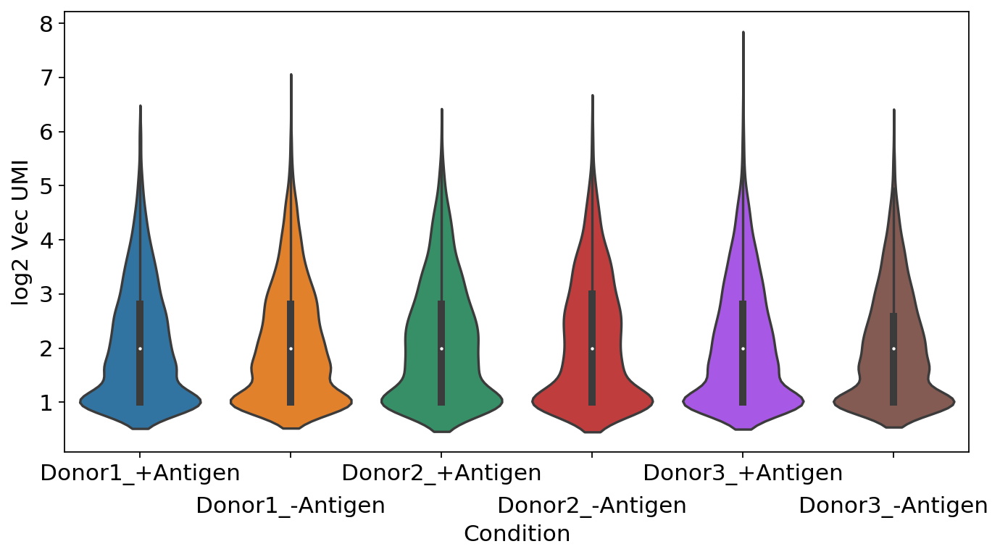

In [43]:
plt.figure(figsize=(10,5))
ax = sns.violinplot(x='Condition', y='log2 Vec UMI',data=df, scale='width')
labels = ax.set_xticklabels(df['Condition'].cat.categories)
for i, label in enumerate(labels):
    label.set_y(label.get_position()[1] - (i % 2) * 0.075)
plt.grid(False)

# Supplementary Figure 4

## SFigure 4A

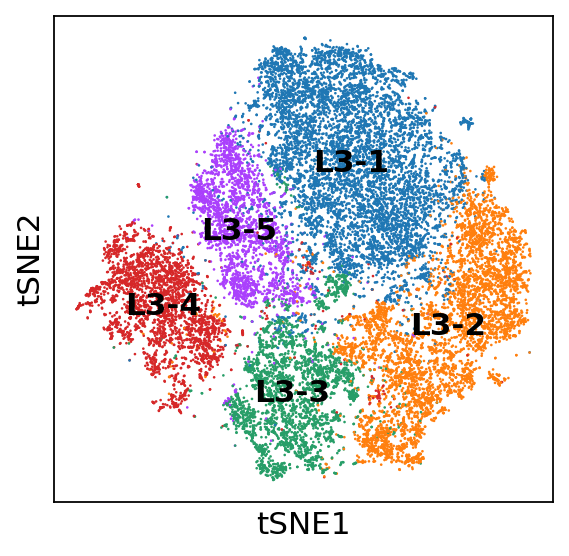

In [44]:
sc.pl.tsne(DS_data, color=['Louvain_Clusters'], legend_loc='on data', legend_fontsize=14, title='')

## SFigure 4B

In [7]:
DS_data.obs['Project_onto_bulk_new'] = DS_data.obs['Project_onto_bulk_new'].astype('category')
DS_data.obs['Project_onto_bulk_new'] = DS_data.obs['Project_onto_bulk_new'].cat.reorder_categories(['CD8+_Central Memory', 'CD8+_Effector Memory',
                                                                                                   'CD8+_Naive', 'CD8+_Treg',
                                                                                                   'CD8+_Unassigned', 'CD8-_Central Memory',
                                                                                                   'CD8-_Effector Memory', 'CD8-_Naive',
                                                                                                   'CD8-_Treg', 'CD8-_Unassigned'])
DS_data.uns['Project_onto_bulk_new_colors'] = sc.pl.palettes.default_20[0:10]

Project_onto_bulk_new,CD8+_Central Memory,CD8+_Effector Memory,CD8+_Naive,CD8+_Treg,CD8+_Unassigned,CD8-_Central Memory,CD8-_Effector Memory,CD8-_Naive,CD8-_Treg,CD8-_Unassigned
Louvain_Clusters,,,,,,,,,,
L3-1,97,154,356,76,295,1009,452,2541,417,2269
L3-2,41,551,71,190,103,150,1853,153,1600,466
L3-3,29,603,466,169,218,100,171,652,272,459
L3-4,56,157,311,60,187,233,364,908,292,536
L3-5,62,433,1574,45,391,5,21,42,3,13


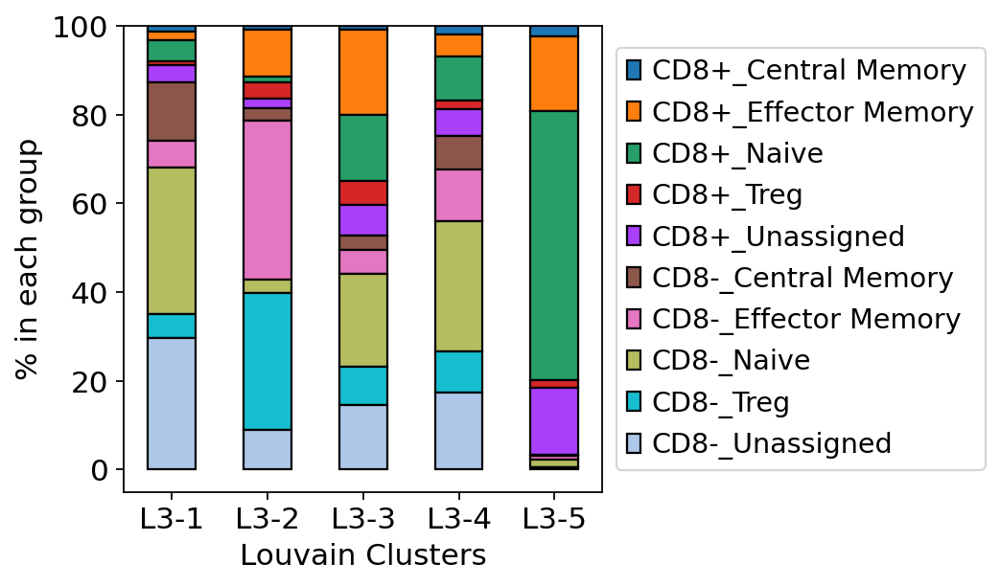

In [14]:
lv_stat_barplot(DS_data, color= DS_data.uns['Project_onto_bulk_new_colors'], ylab="% in each group", xlab="Louvain Clusters",splitby="Louvain_Clusters", colorby="Project_onto_bulk_new", hatch=False, save='SFig4B.pdf')

## SFigure 4C

col_0,Negative,Positive
Louvain_Clusters,,
L3-1,7098,568
L3-2,4485,693
L3-3,1868,1271
L3-4,2553,551
L3-5,298,2291


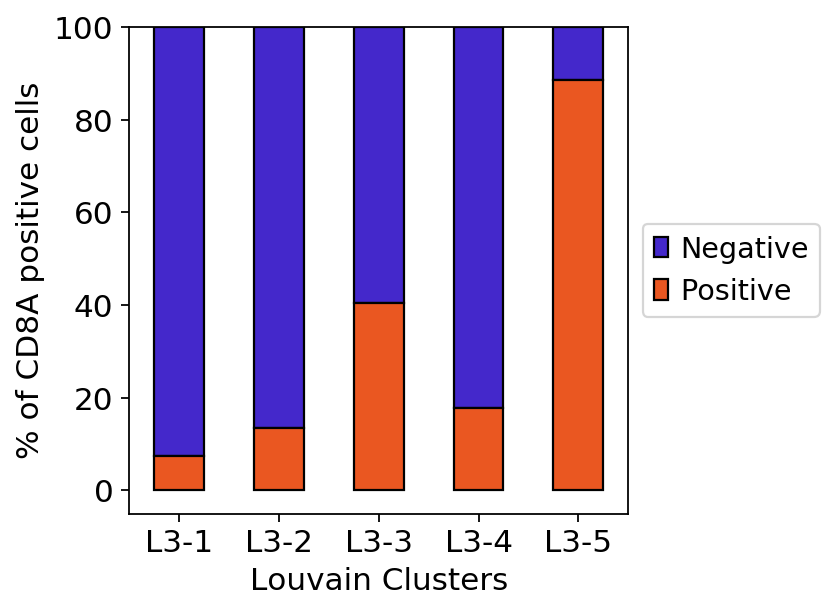

In [46]:
lv_stat_barplot(DS_data, ylab="% of CD8A positive cells", xlab="Louvain Clusters",splitby="Louvain_Clusters", colorby="CD8A", hatch=False)

## SFigure 4D

In [47]:
CT = DS_data.obs['Proj_onto_bulk'].cat.categories
for ct in CT:
    DS_data.obs['CT_'+ct] = np.in1d(DS_data.obs['Proj_onto_bulk'], ct)
    DS_data.obs['CT_'+ct] = DS_data.obs['CT_'+ct].astype('category')
    DS_data.uns['CT_'+ct+'_colors'] = ['#C0C0C0', '#ff0000']

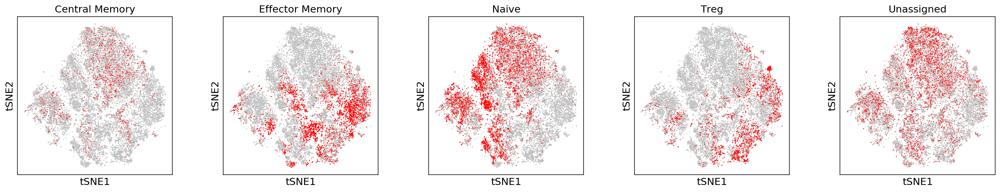

In [48]:
sc.pl.tsne(DS_data, color=['CT_'+x for x in CT], title=CT, ncols=5, legend_loc='')

## SFigure 4E

Louvain_Clusters,L3-1,L3-2,L3-3,L3-4,L3-5
Proj_onto_bulk,,,,,
Central Memory,1106,191,129,289,67
Effector Memory,606,2404,774,521,454
Naive,2897,224,1118,1219,1616
Treg,493,1790,441,352,48
Unassigned,2564,569,677,723,404


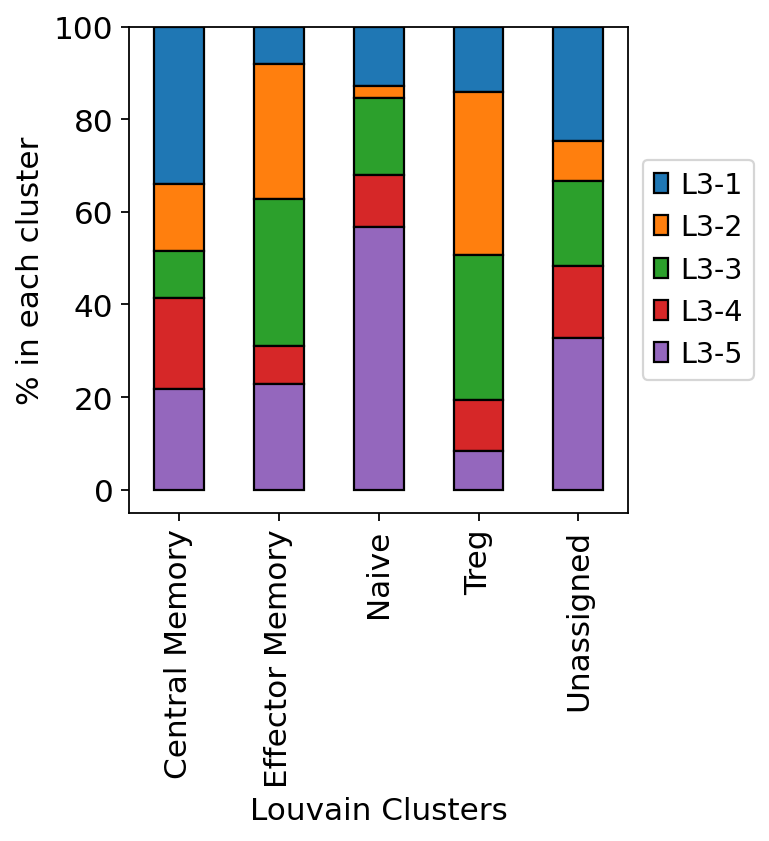

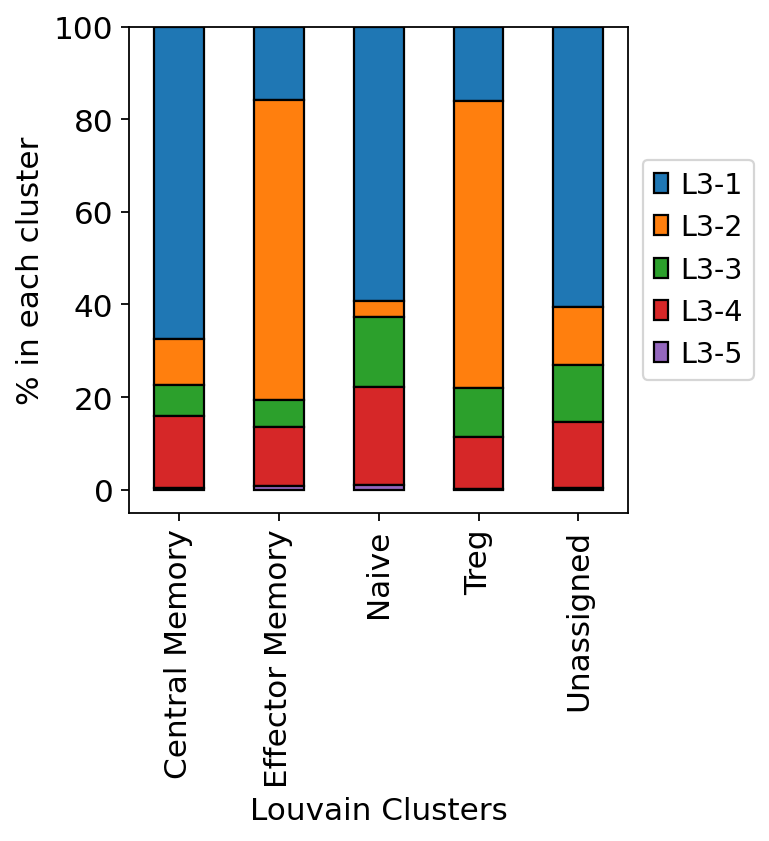

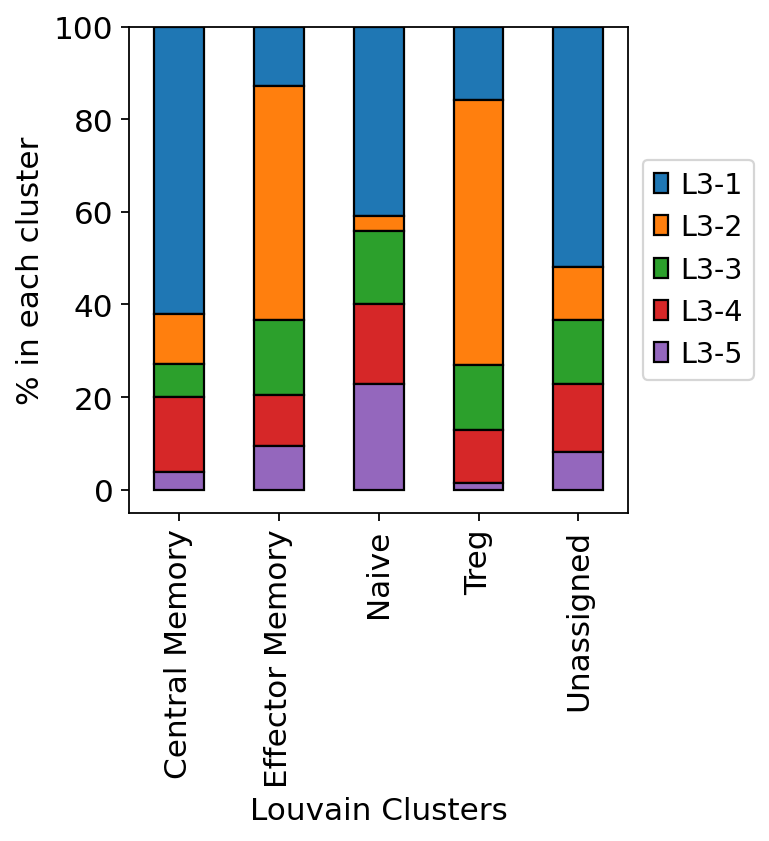

In [32]:
DS_data_CD8pos = DS_data[['CD8+' in x for x in DS_data.obs['Project_onto_bulk_new']]]
lv_stat_barplot(DS_data_CD8pos,ylab="% in each cluster", xlab="Louvain Clusters", splitby="Proj_onto_bulk", colorby="Louvain_Clusters", hatch=False)

DS_data_CD8neg = DS_data[['CD8-' in x for x in DS_data.obs['Project_onto_bulk_new']]]
lv_stat_barplot(DS_data_CD8neg, ylab="% in each cluster", xlab="Louvain Clusters", splitby="Proj_onto_bulk", colorby="Louvain_Clusters", hatch=False)

lv_stat_barplot(DS_data,ylab="% in each cluster", xlab="Louvain Clusters", splitby="Proj_onto_bulk", colorby="Louvain_Clusters", hatch=False)

## SFigure 4F

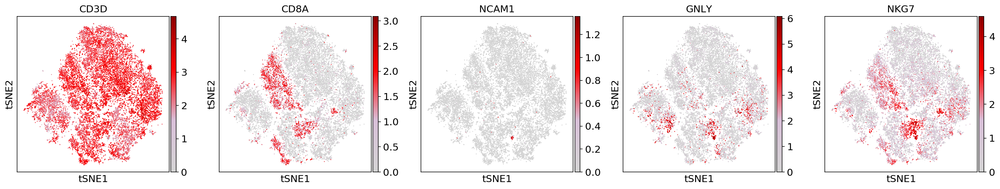

In [49]:
sc.pl.tsne(DS_data, color=['CD3D', 'CD8A', 'NCAM1', 'GNLY', 'NKG7'], legend_fontsize=14, ncols=5, color_map=cmap)

## SFigure 4F

Donor,Donor1,Donor2,Donor3
Louvain_Clusters,,,
L3-1,4077,1601,1988
L3-2,255,2393,2530
L3-3,1280,1347,512
L3-4,1128,652,1324
L3-5,482,1370,737


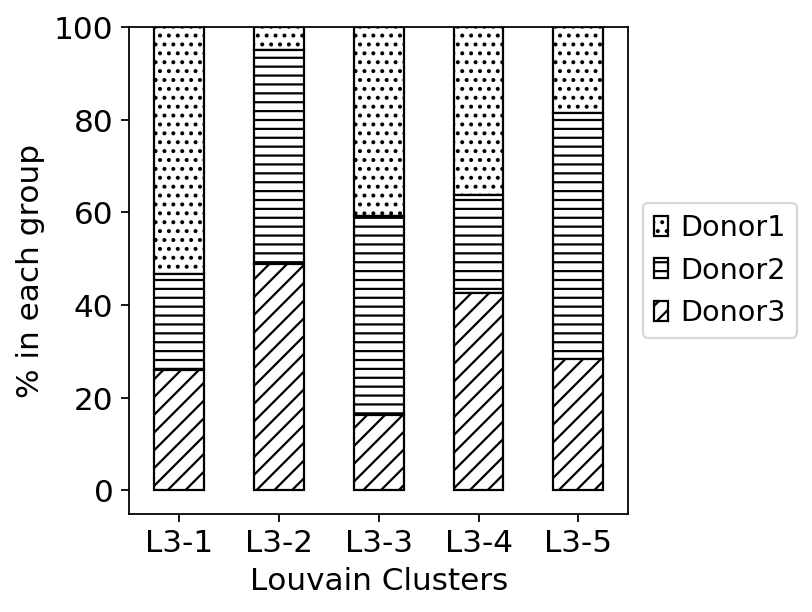

In [50]:
lv_stat_barplot(DS_data, xlab="Louvain Clusters", splitby="Louvain_Clusters", colorby="Donor", color='white')

## SFigure 4G

Project_onto_bulk_new,CD8+_Central Memory,CD8+_Effector Memory,CD8+_Naive,CD8+_Treg,CD8+_Unassigned,CD8-_Central Memory,CD8-_Effector Memory,CD8-_Naive,CD8-_Treg,CD8-_Unassigned
Donor,,,,,,,,,,
Donor1,64,358,629,95,314,691,454,2418,466,1733
Donor2,169,1097,1350,284,556,500,1008,716,808,875
Donor3,52,443,799,161,324,306,1399,1162,1310,1135


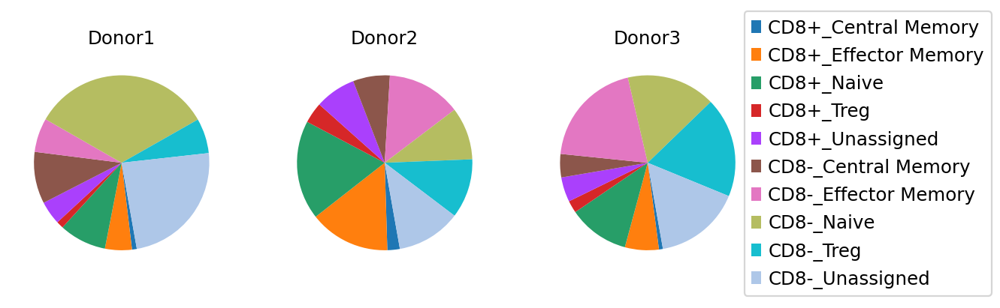

In [9]:
lv_stat_barplot(DS_data, color=DS_data.uns['Project_onto_bulk_new_colors'], splitby="Donor", colorby="Project_onto_bulk_new", plotMethod="PieChart", startangle=-80, save='SFig4G.pdf')

# Supplementary Figure 5

## SFigure 5A

In [52]:
newDF = pd.concat([Tcells_data.obs['Louvain_Clusters'], DT_data.obs['Louvain_Clusters']], axis=1,sort=False)
newDF.columns = ['Tcells', 'DT']
Tcells_data.obs['DT_L2'] = newDF['DT'].cat.add_categories("+Antigen").fillna("+Antigen")
Tcells_data.uns['DT_L2_colors'] = np.append(sc.pl.palettes.default_20[0:5], '#d3d3d3')

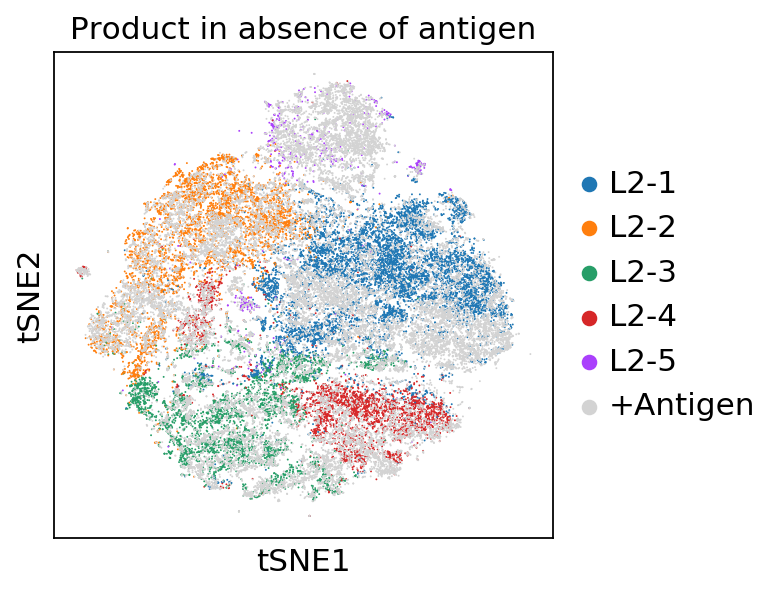

In [54]:
sc.pl.tsne(Tcells_data, color=['DT_L2'], legend_loc='right margin', legend_fontsize=14, title='Product in absence of antigen')

## SFigure 5B

In [55]:
newDF = pd.concat([Tcells_data.obs['Louvain_Clusters'], DS_data.obs['Louvain_Clusters']], axis=1,sort=False)
newDF.columns = ['Tcells', 'DS']
Tcells_data.obs['DS_L3'] = newDF['DS'].cat.add_categories("-Antigen").fillna("-Antigen")
Tcells_data.uns['DS_L3_colors'] = np.append(sc.pl.palettes.default_20[0:5], '#d3d3d3')

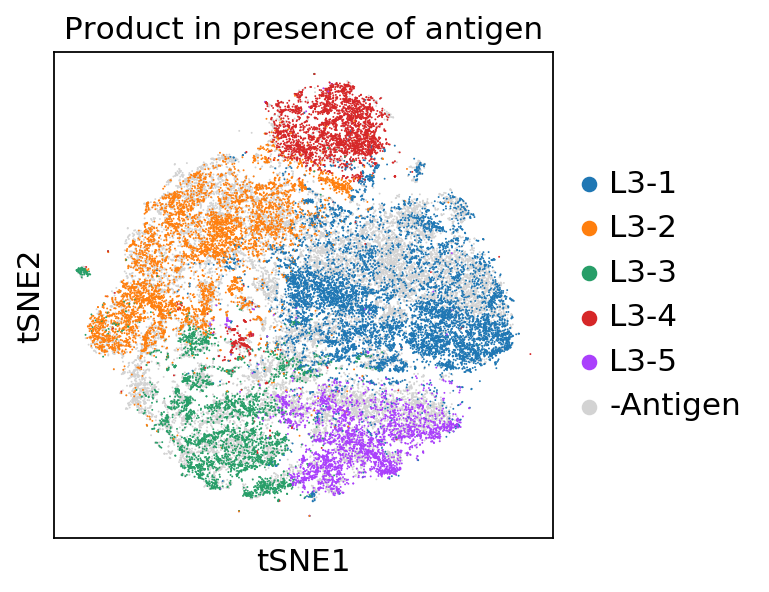

In [56]:
sc.pl.tsne(Tcells_data, color=['DS_L3'], legend_loc='right margin', legend_fontsize=14, title='Product in presence of antigen')

## SFigure 5C

In [57]:
newDF = pd.concat([Tcells_data.obs['Louvain_Clusters'], VP_data.obs['Louvain_Clusters']], axis=1,sort=False)
newDF.columns = ['Tcells', 'VP']
Tcells_data.obs['VP_L5'] = newDF['VP'].cat.add_categories("CAR neg").fillna("CAR neg")
Tcells_data.uns['VP_L5_colors'] = np.append(sc.pl.palettes.default_20[0:6], '#d3d3d3')

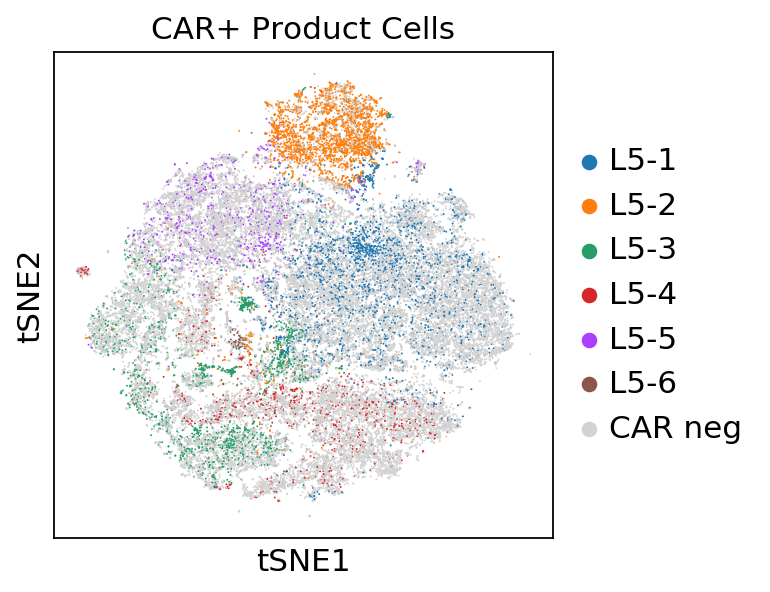

In [58]:
sc.pl.tsne(Tcells_data, color=['VP_L5'], legend_loc='right margin', legend_fontsize=14, title='CAR+ Product Cells')

## SFigure 5D

In [59]:
LC_table = pd.concat([Tcells_data.obs['Louvain_Clusters'], DT_data.obs['Louvain_Clusters'], DS_data.obs['Louvain_Clusters']], axis=1, sort=True)

In [60]:
Tcells_data.obs['DT_LC'] = LC_table.iloc[:,1]
Tcells_data.obs['DT_LC'] = Tcells_data.obs['DT_LC'].astype('category')
Tcells_data.obs['DT_LC'] = Tcells_data.obs['DT_LC'].cat.add_categories('+Antigen').fillna('+Antigen')
Tcells_data.uns['DT_LC_colors'] = np.append(vega_20_scanpy[0:5], '#d3d3d3')

DT_LC,L2-1,L2-2,L2-3,L2-4,L2-5,+Antigen
Louvain_Clusters,,,,,,
L4-1,6700,145,171,66,56,7142
L4-2,175,24,572,2644,17,3213
L4-3,465,33,2493,69,5,3298
L4-4,55,2613,4,30,108,2406
L4-5,55,1337,357,13,147,2349
L4-6,27,21,143,12,324,3268


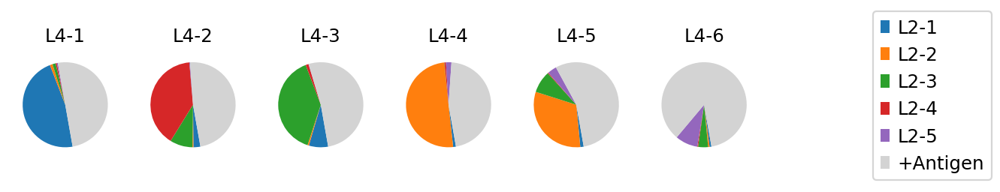

In [61]:
lv_stat_barplot(Tcells_data, color=Tcells_data.uns['DT_LC_colors'], splitby="Louvain_Clusters", colorby="DT_LC", plotMethod="PieChart", startangle=-80, ncols=6)

## SFigure 5E

In [62]:
Tcells_data.obs['DS_LC'] = LC_table.iloc[:,2]
Tcells_data.obs['DS_LC'] = Tcells_data.obs['DS_LC'].astype('category')
Tcells_data.obs['DS_LC'] = Tcells_data.obs['DS_LC'].cat.add_categories('-Antigen').fillna('-Antigen')
Tcells_data.uns['DS_LC_colors'] = np.append(vega_20_scanpy[0:5], '#d3d3d3')

DS_LC,L3-1,L3-2,L3-3,L3-4,L3-5,-Antigen
Louvain_Clusters,,,,,,
L4-1,6802,231,39,32,38,7138
L4-2,175,317,379,23,2319,3432
L4-3,468,20,2598,7,205,3065
L4-4,112,2291,0,3,0,2810
L4-5,18,2217,96,18,0,1909
L4-6,91,102,27,3021,27,527


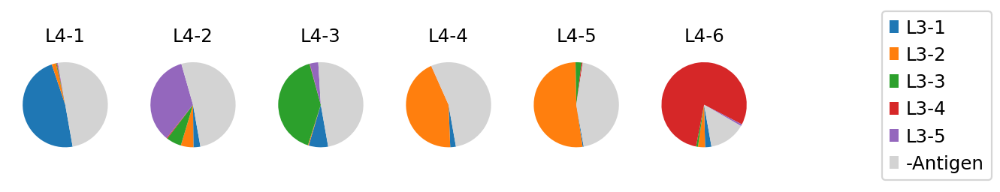

In [64]:
lv_stat_barplot(Tcells_data, color=Tcells_data.uns['DS_LC_colors'], ncols=6, splitby="Louvain_Clusters", colorby="DS_LC", plotMethod="PieChart", startangle=-80)

# Supplementary Figure 6

## SFigure 6A

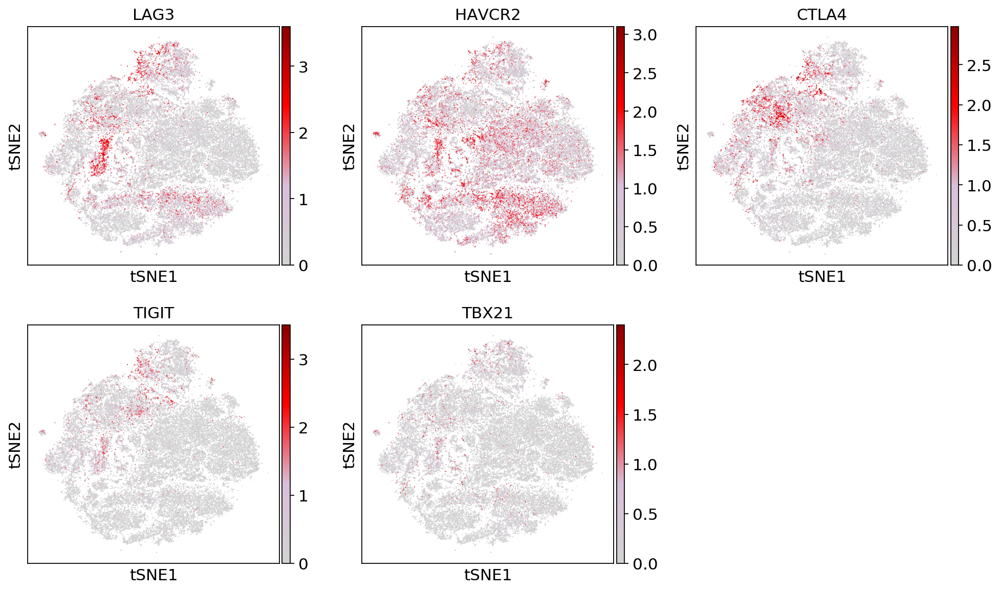

In [65]:
sc.pl.tsne(Tcells_data, color=['LAG3', 'HAVCR2', 'CTLA4', 'TIGIT', 'TBX21'], legend_fontsize=14, color_map=cmap,ncols=3)

## SFigure 6B

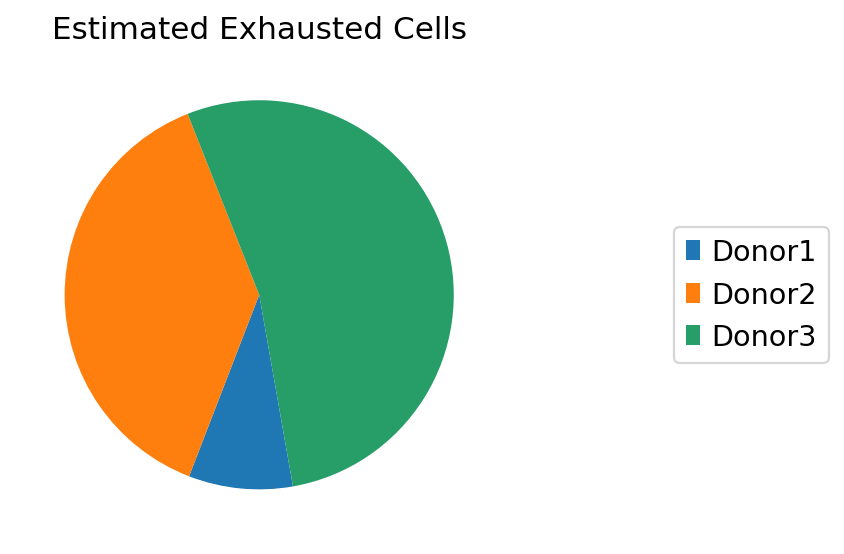

In [67]:
df_exh = pd.crosstab(Tcells_data.obs['Donor'] ,Tcells_data.obs['Ex_Score'])
plt.title('Estimated Exhausted Cells')
patches, texts = plt.pie(df_exh['Exhausted'],startangle = -80, counterclock=False)
plt.legend(patches, df_exh.index, loc="right", bbox_to_anchor=(1.7,0.5))